In [1]:
library(reticulate)
use_python("/opt/conda/bin/python3.10",required=T)
py_config()
library(rhdf5)
library(Seurat)
library(ggplot2)
library(dplyr)
library(readr)
library(spatialLIBD)
library(aricode)
source('BEER/BEER.R')

python:         /opt/conda/bin/python3.10
libpython:      /opt/conda/lib/libpython3.10.so
pythonhome:     /opt/conda:/opt/conda
version:        3.10.11 (main, Apr 20 2023, 19:02:41) [GCC 11.2.0]
numpy:          /opt/conda/lib/python3.10/site-packages/numpy
numpy_version:  1.22.4

NOTE: Python version was forced by use_python function

The legacy packages maptools, rgdal, and rgeos, underpinning the sp package,
which was just loaded, will retire in October 2023.
Please refer to R-spatial evolution reports for details, especially
https://r-spatial.org/r/2023/05/15/evolution4.html.
It may be desirable to make the sf package available;
package maintainers should consider adding sf to Suggests:.
The sp package is now running under evolution status 2
     (status 2 uses the sf package in place of rgdal)

Attaching SeuratObject


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


Loading required package: SpatialExperiment

Loading required package: SingleCellExperiment

Loading required package: SummarizedExperiment

Loading required package: MatrixGenerics

Loading required package: matrixStats


Attaching package: ‘matrixStats’


The following object is masked from ‘package

[1] "Welcome to BEER (v0.1.9)!"


Loading required package: mgcv

Loading required package: nlme


Attaching package: ‘nlme’


The following object is masked from ‘package:IRanges’:

    collapse


The following object is masked from ‘package:dplyr’:

    collapse


This is mgcv 1.9-0. For overview type 'help("mgcv-package")'.

Loading required package: genefilter


Attaching package: ‘genefilter’


The following objects are masked from ‘package:MatrixGenerics’:

    rowSds, rowVars


The following objects are masked from ‘package:matrixStats’:

    rowSds, rowVars


The following object is masked from ‘package:readr’:

    spec


Loading required package: BiocParallel


Attaching package: ‘limma’


The following object is masked from ‘package:BiocGenerics’:

    plotMA




In [2]:
getwd()

[1] "/workspace/spatial_integration"

In [3]:
start_time = Sys.time()
# Sys.sleep(60)
end_time = Sys.time()
duration = end_time - start_time

print(start_time)
print(end_time)
print(duration)

[1] "2023-10-11 10:40:16 KST"
[1] "2023-10-11 10:40:16 KST"
Time difference of 0.0005507469 secs


In [5]:
spe_all <- readRDS('dataset/spe_all.rds')
D1=readRDS('dataset/df_logcount_507.rds')
D2=readRDS('dataset/df_logcount_672.rds')
D3=readRDS('dataset/df_logcount_673.rds')

In [6]:
# D1=readRDS('/home/spatial_integration/spatialLIBD/r_lib/assay_151507.rds')
# D2=readRDS('spatialLIBD/r_lib/assay_151672.rds')
# D3=readRDS('spatialLIBD/r_lib/assay_151673.rds')

BATCH_default =c(rep('D1',ncol(D1)),
        rep('D2',ncol(D2)),
        rep('D3',ncol(D3)) )

D12=.simple_combine(D1,D2)$combine
D123=.simple_combine(D12,D3)$combine

DATA_default = D123

# rm(D1);rm(D2);rm(D3);rm(D12)

In [7]:
start_time <- Sys.time()

DATA <- read_csv('dataset/datapoints/embed_all_com3_unfil.csv', name_repair='minimal')
end_time <- Sys.time()
duration <- end_time - start_time
print(duration)

Rows: 67076 Columns: 11881
── Column specification ────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: ","
chr     (1): 
dbl (11880): AAACAACGAATAGTTC-1, AAACAAGTATCTCCCA-1, AAACAATCTACTAGCA-1, AAA...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


Time difference of 29.54227 secs


In [8]:
spe_507 <- spe_all[, spe_all$sample_id == '151507']
spe_672 <- spe_all[, spe_all$sample_id == '151672']
spe_673 <- spe_all[, spe_all$sample_id == '151673']

In [9]:
LAYER=c(colData(spe_507)$'layer_guess',
        colData(spe_672)$'layer_guess',
       colData(spe_673)$'layer_guess')

In [10]:
class(LAYER)

[1] "factor"

In [11]:
char_layer <- as.character(LAYER)
# char_layer

In [12]:
class(char_layer)
length(char_layer)

[1] "character"

[1] 11880

In [13]:
BATCH=c(rep('D1',ncol(D1)),
        rep('D2',ncol(D2)),
        rep('D3',ncol(D3)) )


In [14]:
D1

,AAACAACGAATAGTTC-1,AAACAAGTATCTCCCA-1,AAACAATCTACTAGCA-1,AAACACCAATAACTGC-1,AAACAGCTTTCAGAAG-1,AAACAGGGTCTATATT-1,AAACAGTGTTCCTGGG-1,AAACATTTCCCGGATT-1,AAACCACTACACAGAT-1,AAACCCGAACGAAATC-1,⋯,TTGTGTATGCCACCAA-1,TTGTGTTTCCCGAAAG-1,TTGTTAGCAAATTCGA-1,TTGTTCAGTGTGCTAC-1,TTGTTCTAGATACGCT-1,TTGTTGTGTGTCAAGA-1,TTGTTTCACATCCAGG-1,TTGTTTCATTAGTCTA-1,TTGTTTCCATACAACT-1,TTGTTTGTGTAAATTC-1
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000243485,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,0,⋯,0,0.0000000,0.000000,0,0.000000,0,0.000000,0,0.000000,0
ENSG00000237613,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,0,⋯,0,0.0000000,0.000000,0,0.000000,0,0.000000,0,0.000000,0
ENSG00000186092,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,0,⋯,0,0.0000000,0.000000,0,0.000000,0,0.000000,0,0.000000,0
ENSG00000238009,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,0,⋯,0,0.0000000,0.000000,0,0.000000,0,0.000000,0,0.000000,0
ENSG00000239945,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,0,⋯,0,0.0000000,0.000000,0,0.000000,0,0.000000,0,0.000000,0
ENSG00000239906,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,0,⋯,0,0.0000000,0.000000,0,0.000000,0,0.000000,0,0.000000,0
ENSG00000241599,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,0,⋯,0,0.0000000,0.000000,0,0.000000,0,0.000000,0,0.000000,0
ENSG00000236601,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,0,⋯,0,0.0000000,0.000000,0,0.000000,0,0.000000,0,0.000000,0
ENSG00000284733,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,0,⋯,0,0.0000000,0.000000,0,0.000000,0,0.000000,0,0.000000,0


In [15]:
D2

,AAACAAGTATCTCCCA-1,AAACACCAATAACTGC-1,AAACAGAGCGACTCCT-1,AAACAGCTTTCAGAAG-1,AAACAGGGTCTATATT-1,AAACATTTCCCGGATT-1,AAACCACTACACAGAT-1,AAACCCGAACGAAATC-1,AAACCGGAAATGTTAA-1,AAACCGGGTAGGTACC-1,⋯,TTGTGTATGCCACCAA-1,TTGTGTTTCCCGAAAG-1,TTGTTAGCAAATTCGA-1,TTGTTCAGTGTGCTAC-1,TTGTTCTAGATACGCT-1,TTGTTGTGTGTCAAGA-1,TTGTTTCACATCCAGG-1,TTGTTTCATTAGTCTA-1,TTGTTTCCATACAACT-1,TTGTTTGTGTAAATTC-1
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000243485,0.0000000,0.00000,0.000000,0,0.000000,0,0.0000000,0.000000,0.0000000,0.000000,⋯,0,0,0.0000000,0.0000000,0,0,0,0,0.000000,0.0000000
ENSG00000237613,0.0000000,0.00000,0.000000,0,0.000000,0,0.0000000,0.000000,0.0000000,0.000000,⋯,0,0,0.0000000,0.0000000,0,0,0,0,0.000000,0.0000000
ENSG00000186092,0.0000000,0.00000,0.000000,0,0.000000,0,0.0000000,0.000000,0.0000000,0.000000,⋯,0,0,0.0000000,0.0000000,0,0,0,0,0.000000,0.0000000
ENSG00000238009,0.0000000,0.00000,0.000000,0,0.000000,0,0.0000000,0.000000,0.0000000,0.000000,⋯,0,0,0.0000000,0.0000000,0,0,0,0,0.000000,0.0000000
ENSG00000239945,0.0000000,0.00000,0.000000,0,0.000000,0,0.0000000,0.000000,0.0000000,0.000000,⋯,0,0,0.0000000,0.0000000,0,0,0,0,0.000000,0.0000000
ENSG00000239906,0.0000000,0.00000,0.000000,0,0.000000,0,0.0000000,0.000000,0.0000000,0.000000,⋯,0,0,0.0000000,0.0000000,0,0,0,0,0.000000,0.0000000
ENSG00000241599,0.0000000,0.00000,0.000000,0,0.000000,0,0.0000000,0.000000,0.0000000,0.000000,⋯,0,0,0.0000000,0.0000000,0,0,0,0,0.000000,0.0000000
ENSG00000236601,0.0000000,0.00000,0.000000,0,0.000000,0,0.0000000,0.000000,0.0000000,0.000000,⋯,0,0,0.0000000,0.0000000,0,0,0,0,0.000000,0.0000000
ENSG00000284733,0.0000000,0.00000,0.000000,0,0.000000,0,0.0000000,0.000000,0.0000000,0.000000,⋯,0,0,0.0000000,0.0000000,0,0,0,0,0.000000,0.0000000


In [16]:
D3

,AAACAAGTATCTCCCA-1,AAACAATCTACTAGCA-1,AAACACCAATAACTGC-1,AAACAGAGCGACTCCT-1,AAACAGCTTTCAGAAG-1,AAACAGGGTCTATATT-1,AAACAGTGTTCCTGGG-1,AAACATTTCCCGGATT-1,AAACCCGAACGAAATC-1,AAACCGGGTAGGTACC-1,⋯,TTGTGTATGCCACCAA-1,TTGTGTTTCCCGAAAG-1,TTGTTAGCAAATTCGA-1,TTGTTCAGTGTGCTAC-1,TTGTTGTGTGTCAAGA-1,TTGTTTCACATCCAGG-1,TTGTTTCATTAGTCTA-1,TTGTTTCCATACAACT-1,TTGTTTGTATTACACG-1,TTGTTTGTGTAAATTC-1
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000243485,0.0000000,0.00000,0.0000000,0,0.0000000,0,0,0.0000000,0.0000000,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000237613,0.0000000,0.00000,0.0000000,0,0.0000000,0,0,0.0000000,0.0000000,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000186092,0.0000000,0.00000,0.0000000,0,0.0000000,0,0,0.0000000,0.0000000,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000238009,0.0000000,0.00000,0.0000000,0,0.0000000,0,0,0.0000000,0.0000000,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000239945,0.0000000,0.00000,0.0000000,0,0.0000000,0,0,0.0000000,0.0000000,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000239906,0.0000000,0.00000,0.0000000,0,0.0000000,0,0,0.0000000,0.0000000,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000241599,0.0000000,0.00000,0.0000000,0,0.0000000,0,0,0.0000000,0.0000000,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000236601,0.0000000,0.00000,0.0000000,0,0.0000000,0,0,0.0000000,0.0000000,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000284733,0.0000000,0.00000,0.0000000,0,0.0000000,0,0,0.0000000,0.0000000,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000


In [17]:
DATA_default

,AAACAACGAATAGTTC-1,AAACAAGTATCTCCCA-1,AAACAATCTACTAGCA-1,AAACACCAATAACTGC-1,AAACAGCTTTCAGAAG-1,AAACAGGGTCTATATT-1,AAACAGTGTTCCTGGG-1,AAACATTTCCCGGATT-1,AAACCACTACACAGAT-1,AAACCCGAACGAAATC-1,⋯,TTGTGTATGCCACCAA-1,TTGTGTTTCCCGAAAG-1,TTGTTAGCAAATTCGA-1,TTGTTCAGTGTGCTAC-1,TTGTTGTGTGTCAAGA-1,TTGTTTCACATCCAGG-1,TTGTTTCATTAGTCTA-1,TTGTTTCCATACAACT-1,TTGTTTGTATTACACG-1,TTGTTTGTGTAAATTC-1
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000000003,0,0.0000000,0,0,0.000000,0.0000000,0.000000,0.0000000,0.5930771,0.0000000,⋯,0.000000,0.000000,0.000000,0.0000000,0.0000000,0.000000,0.000000,0.000000,0.000000,0.0000000
ENSG00000000005,0,0.0000000,0,0,0.000000,0.0000000,0.000000,0.0000000,0.0000000,0.0000000,⋯,0.000000,0.000000,0.000000,0.0000000,0.0000000,0.000000,0.000000,0.000000,0.000000,0.0000000
ENSG00000000419,0,0.0000000,0,0,0.000000,0.0000000,0.000000,0.0000000,0.0000000,0.0000000,⋯,0.000000,0.000000,0.000000,0.0000000,0.0000000,0.000000,0.000000,1.412738,0.000000,0.0000000
ENSG00000000457,0,0.0000000,0,0,0.000000,0.8240501,0.000000,0.0000000,0.0000000,0.0000000,⋯,0.000000,0.000000,0.000000,0.0000000,0.0000000,0.000000,0.000000,0.000000,0.000000,0.0000000
ENSG00000000460,0,0.0000000,0,0,0.000000,0.0000000,0.000000,0.0000000,0.0000000,0.0000000,⋯,0.000000,0.000000,0.000000,0.0000000,0.0000000,0.000000,0.000000,0.000000,0.000000,0.0000000
ENSG00000000938,0,0.0000000,0,0,0.000000,0.0000000,0.000000,0.0000000,0.0000000,0.0000000,⋯,0.000000,0.000000,0.000000,0.0000000,0.0000000,0.000000,0.000000,0.000000,0.000000,0.0000000
ENSG00000000971,0,0.0000000,0,0,0.000000,0.0000000,0.000000,0.0000000,0.0000000,0.0000000,⋯,0.000000,0.000000,0.000000,0.0000000,0.0000000,0.000000,0.000000,0.000000,0.000000,0.0000000
ENSG00000001036,0,0.0000000,0,0,0.000000,0.0000000,0.000000,0.8025096,0.0000000,0.0000000,⋯,0.000000,0.000000,0.000000,0.0000000,0.0000000,0.000000,0.000000,0.000000,0.000000,0.0000000
ENSG00000001084,0,0.8417394,0,0,0.000000,0.0000000,0.000000,0.0000000,0.0000000,0.0000000,⋯,0.000000,0.000000,0.767643,0.0000000,0.0000000,0.000000,0.000000,0.000000,0.000000,0.5685242


In [16]:
DATA

,AAACAACGAATAGTTC-1,AAACAAGTATCTCCCA-1,AAACAATCTACTAGCA-1,AAACACCAATAACTGC-1,AAACAGCTTTCAGAAG-1,AAACAGGGTCTATATT-1,AAACAGTGTTCCTGGG-1,AAACATTTCCCGGATT-1,AAACCACTACACAGAT-1,⋯,TTGTGTATGCCACCAA-1,TTGTGTTTCCCGAAAG-1,TTGTTAGCAAATTCGA-1,TTGTTCAGTGTGCTAC-1,TTGTTGTGTGTCAAGA-1,TTGTTTCACATCCAGG-1,TTGTTTCATTAGTCTA-1,TTGTTTCCATACAACT-1,TTGTTTGTATTACACG-1,TTGTTTGTGTAAATTC-1
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000243485,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000237613,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000186092,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000238009,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000239945,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000239906,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000241599,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000236601,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000284733,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000


In [17]:
DATA_df <- as.data.frame(DATA)
DATA_df

,AAACAACGAATAGTTC-1,AAACAAGTATCTCCCA-1,AAACAATCTACTAGCA-1,AAACACCAATAACTGC-1,AAACAGCTTTCAGAAG-1,AAACAGGGTCTATATT-1,AAACAGTGTTCCTGGG-1,AAACATTTCCCGGATT-1,AAACCACTACACAGAT-1,⋯,TTGTGTATGCCACCAA-1,TTGTGTTTCCCGAAAG-1,TTGTTAGCAAATTCGA-1,TTGTTCAGTGTGCTAC-1,TTGTTGTGTGTCAAGA-1,TTGTTTCACATCCAGG-1,TTGTTTCATTAGTCTA-1,TTGTTTCCATACAACT-1,TTGTTTGTATTACACG-1,TTGTTTGTGTAAATTC-1
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000243485,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000237613,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000186092,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000238009,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000239945,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000239906,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000241599,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000236601,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000284733,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000


In [18]:
rownames(DATA_df) = DATA_df[,1]

In [19]:
DATA_df[,1] <- NULL

In [20]:
DATA_df

,AAACAACGAATAGTTC-1,AAACAAGTATCTCCCA-1,AAACAATCTACTAGCA-1,AAACACCAATAACTGC-1,AAACAGCTTTCAGAAG-1,AAACAGGGTCTATATT-1,AAACAGTGTTCCTGGG-1,AAACATTTCCCGGATT-1,AAACCACTACACAGAT-1,AAACCCGAACGAAATC-1,⋯,TTGTGTATGCCACCAA-1,TTGTGTTTCCCGAAAG-1,TTGTTAGCAAATTCGA-1,TTGTTCAGTGTGCTAC-1,TTGTTGTGTGTCAAGA-1,TTGTTTCACATCCAGG-1,TTGTTTCATTAGTCTA-1,TTGTTTCCATACAACT-1,TTGTTTGTATTACACG-1,TTGTTTGTGTAAATTC-1
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000243485,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000237613,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000186092,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000238009,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000239945,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000239906,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000241599,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000236601,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000284733,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000


In [21]:
DATA <- DATA_df
DATA

,AAACAACGAATAGTTC-1,AAACAAGTATCTCCCA-1,AAACAATCTACTAGCA-1,AAACACCAATAACTGC-1,AAACAGCTTTCAGAAG-1,AAACAGGGTCTATATT-1,AAACAGTGTTCCTGGG-1,AAACATTTCCCGGATT-1,AAACCACTACACAGAT-1,AAACCCGAACGAAATC-1,⋯,TTGTGTATGCCACCAA-1,TTGTGTTTCCCGAAAG-1,TTGTTAGCAAATTCGA-1,TTGTTCAGTGTGCTAC-1,TTGTTGTGTGTCAAGA-1,TTGTTTCACATCCAGG-1,TTGTTTCATTAGTCTA-1,TTGTTTCCATACAACT-1,TTGTTTGTATTACACG-1,TTGTTTGTGTAAATTC-1
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000243485,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000237613,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000186092,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000238009,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000239945,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000239906,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000241599,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000236601,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000284733,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000


In [22]:
length(BATCH)

[1] 11880

In [23]:
class(BATCH)

[1] "character"

In [24]:
dim(D1)
dim(D2)
dim(D3)
dim(DATA)
# dim(dummy_dat)

[1] 33538  4226

[1] 33538  4015

[1] 33538  3639

[1] 67076 11880

In [25]:
mybeer=BEER(DATA, BATCH, GNUM=50, PCNUM=30, ROUND=2, GN=1000, SEED=1, COMBAT=TRUE)

[1] "BEER start!"
[1] "2023-10-10 14:37:58 KST"


Loading required package: stringi



[1] "Group number (GNUM) is:"
[1] 50
[1] "Varible gene number (GN) of each batch is:"
[1] 1000
[1] "ROUND is:"
[1] 2
[1] 1
[1] "D1"


Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”


[1] 2
[1] "D2"


Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”


[1] 3
[1] "D3"


Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”


[1] "Total varible gene number (GN) is:"
[1] 1934


Warning message:
“Non-unique cell names (colnames) present in the input matrix, making unique”
Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”


Found 116 genes with uniform expression within a single batch (all zeros); these will not be adjusted for batch.


Found3batches

Adjusting for0covariate(s) or covariate level(s)

Standardizing Data across genes

Fitting L/S model and finding priors

Finding parametric adjustments

Adjusting the Data


Centering and scaling data matrix



[1] "Calculating PCs ..."


PC_ 1 
Positive:  ENSG00000170421 
Negative:  ENSG00000112186 

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”
14:40:11 UMAP embedding parameters a = 0.9922 b = 1.112

Found more than one class "dist" in cache; using the first, from namespace 'BiocGenerics'

Also defined by ‘spam’

14:40:11 Read 11880 rows and found 30 numeric columns

14:40:11 Using Annoy for neighbor search, n_neighbors = 30

Found more than one class "dist" in cache; using the first, from namespace 'BiocGenerics'

Also defined by ‘spam’

14:40:11 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*

[1] "Get group for:"
[1] "D1"
[1] "Group Number:"
[1] 50
[1] "Get group for:"
[1] "D2"
[1] "Group Number:"
[1] 50
[1] "Get group for:"
[1] "D3"
[1] "Group Number:"
[1] 50
[1] "Finding MN pairs..."
[1] "1 / 150"
[1] "101 / 150"
[1] "ROUND:"
[1] 1
[1] "ROUND:"
[1] 2
[1] "Number of MN pairs:"
[1] 24
[1] "Evaluating PCs ..."
[1] "Start"


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 1


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 2


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 3


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 4


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 5


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 6


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 7


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 8


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 9


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 10


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 11


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 12


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 13


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 14


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 15


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 16


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 17


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 18


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 19


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 20


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 21


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 22


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 23


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 24


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 25


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 26


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 27


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 28


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 29


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 30
[1] "Finished!!!"
[1] "############################################################################"
[1] "BEER cheers !!! All main steps finished."
[1] "############################################################################"
[1] "2023-10-10 14:41:29 KST"


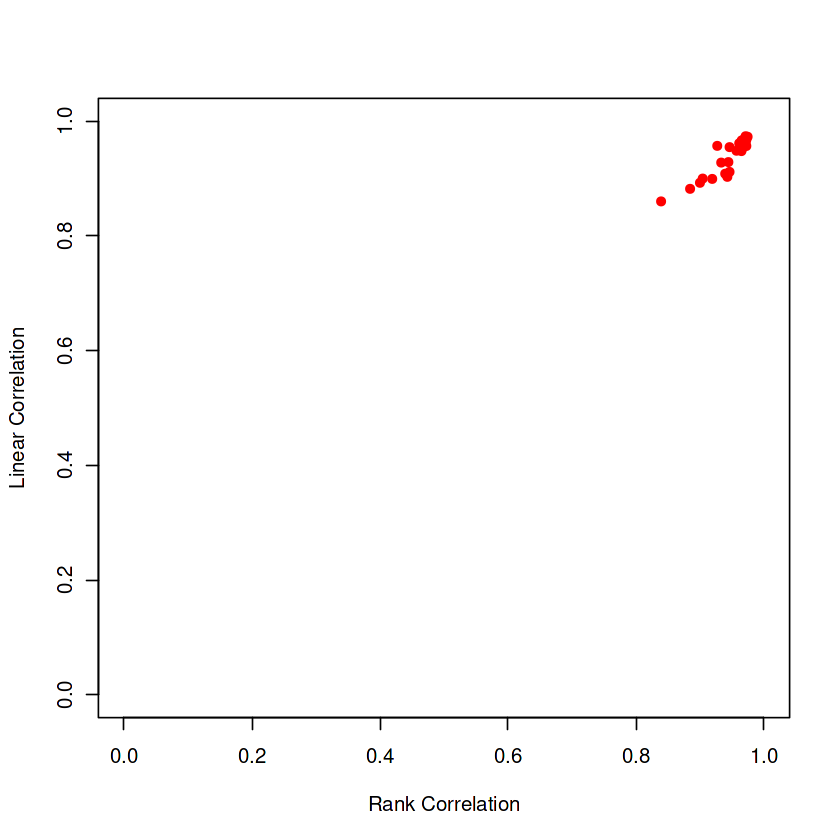

In [26]:
PCUSE=mybeer$select
COL=rep('black',length(mybeer$cor))
COL[PCUSE]='red'
plot(mybeer$cor,mybeer$lcor,pch=16,col=COL,
    xlab='Rank Correlation',ylab='Linear Correlation',xlim=c(0,1),ylim=c(0,1))

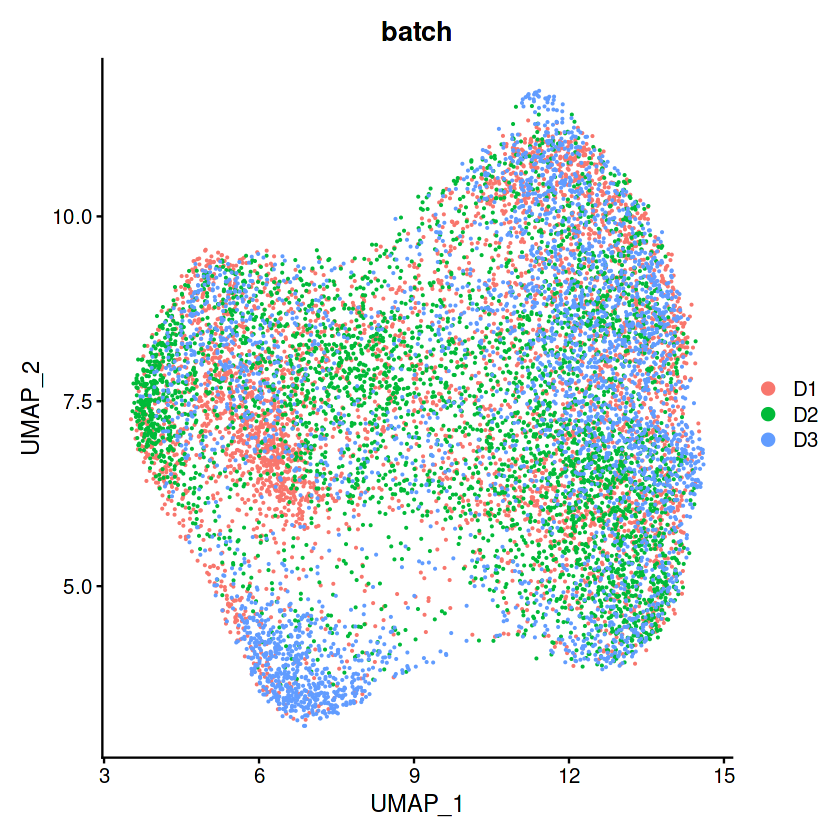

In [28]:
pbmc <- mybeer$seurat
PCUSE <- mybeer$select
pbmc@meta.data$orig.ident=char_layer
pbmc <- RunUMAP(object = pbmc, reduction='pca',dims = PCUSE, umap.method='umap-learn', metric='correlation')

DimPlot(pbmc, reduction='umap', group.by='batch', pt.size=0.1)  

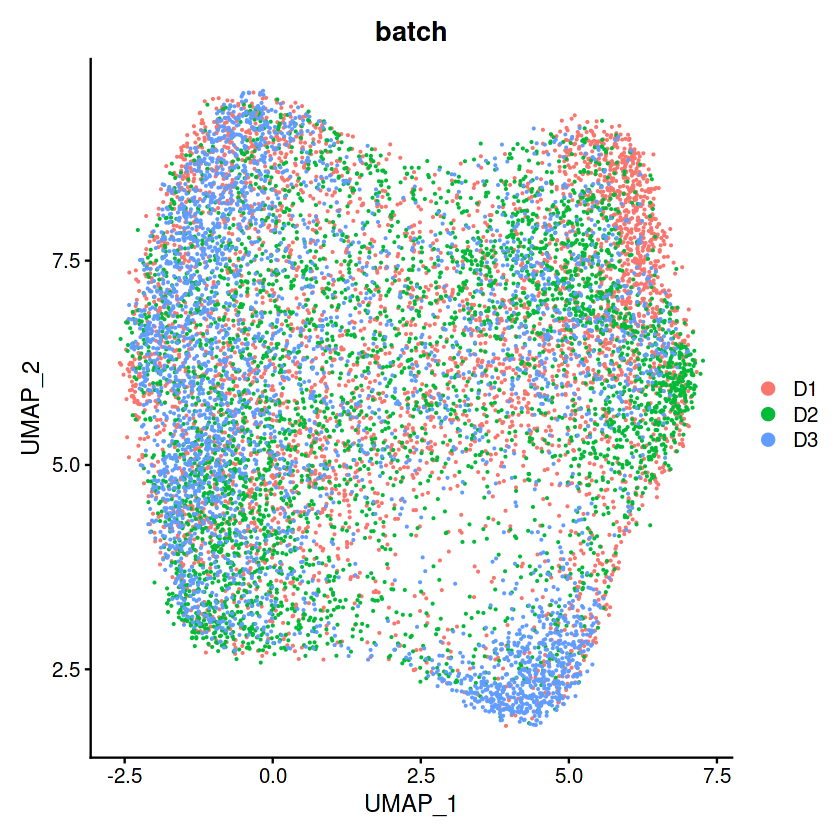

In [25]:
pbmc <- mybeer$seurat
PCUSE <- mybeer$select
pbmc@meta.data$orig.ident=char_layer
pbmc <- RunUMAP(object = pbmc, reduction='pca',dims = PCUSE, umap.method='umap-learn', metric='correlation')

DimPlot(pbmc, reduction='umap', group.by='batch', pt.size=0.1)  

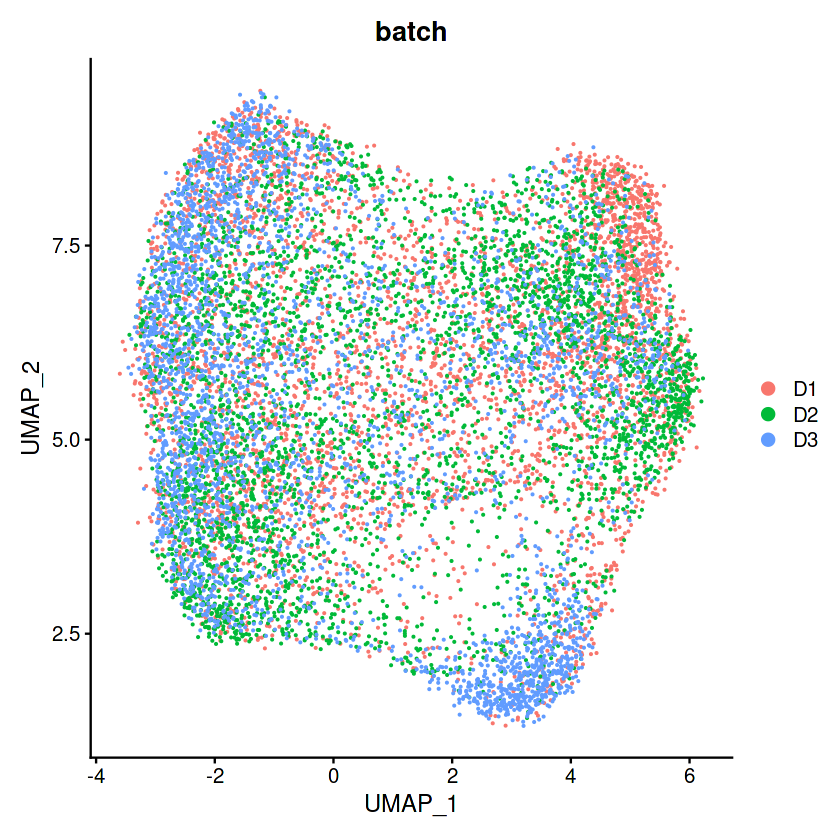

In [27]:
pbmc <- mybeer$seurat
PCUSE <- mybeer$select
pbmc@meta.data$orig.ident=char_layer
pbmc <- RunUMAP(object = pbmc, reduction='pca',dims = PCUSE, umap.method='umap-learn', metric='correlation')

DimPlot(pbmc, reduction='umap', group.by='batch', pt.size=0.1)  

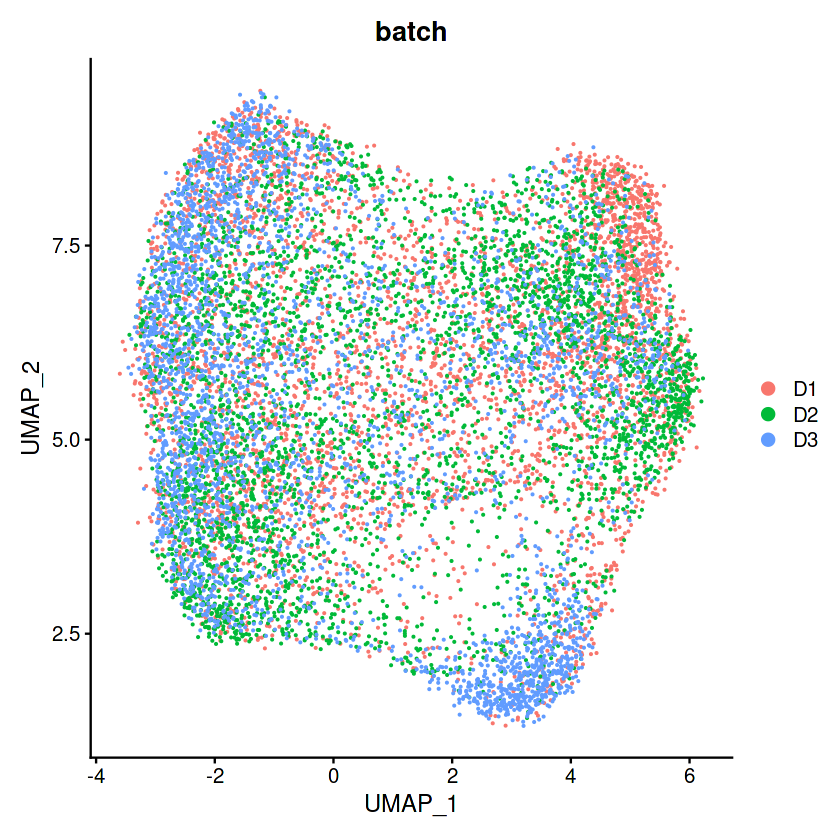

In [27]:
pbmc <- mybeer$seurat
PCUSE <- mybeer$select
pbmc@meta.data$orig.ident=char_layer
pbmc <- RunUMAP(object = pbmc, reduction='pca',dims = PCUSE, umap.method='umap-learn', metric='correlation')

DimPlot(pbmc, reduction='umap', group.by='batch', pt.size=0.1)  

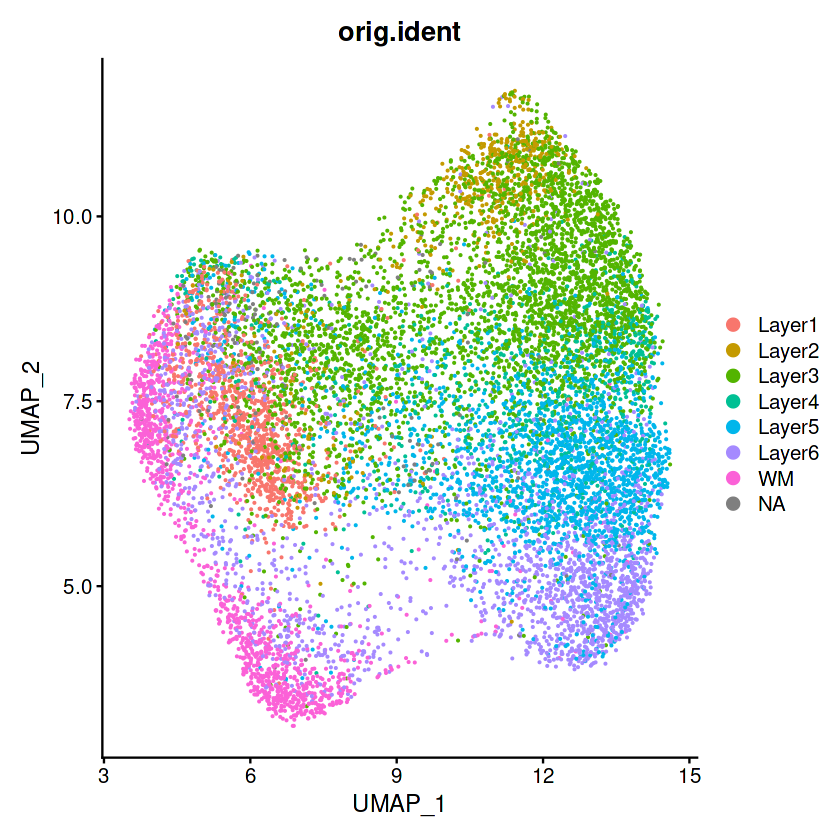

In [29]:
# pbmc <- mybeer$seurat
# PCUSE <- mybeer$select
# pbmc <- RunUMAP(object = pbmc, reduction='pca',dims = PCUSE, umap.method='umap-learn', metric='correlation')

DimPlot(pbmc, reduction='umap', group.by='orig.ident', pt.size=0.1)  

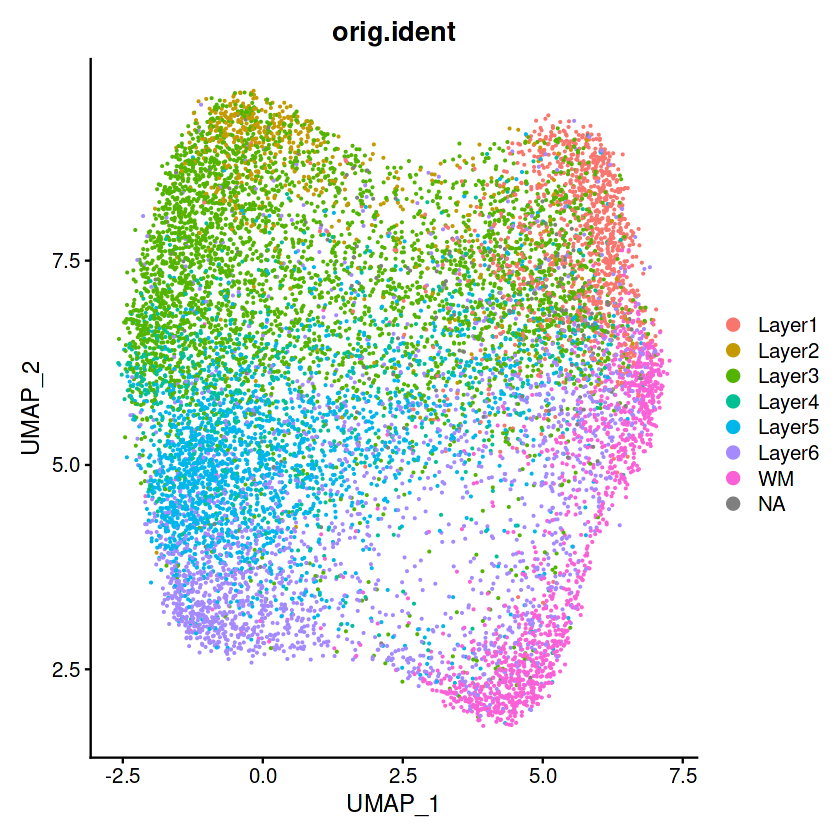

In [26]:
# pbmc <- mybeer$seurat
# PCUSE <- mybeer$select
# pbmc <- RunUMAP(object = pbmc, reduction='pca',dims = PCUSE, umap.method='umap-learn', metric='correlation')

DimPlot(pbmc, reduction='umap', group.by='orig.ident', pt.size=0.1)  

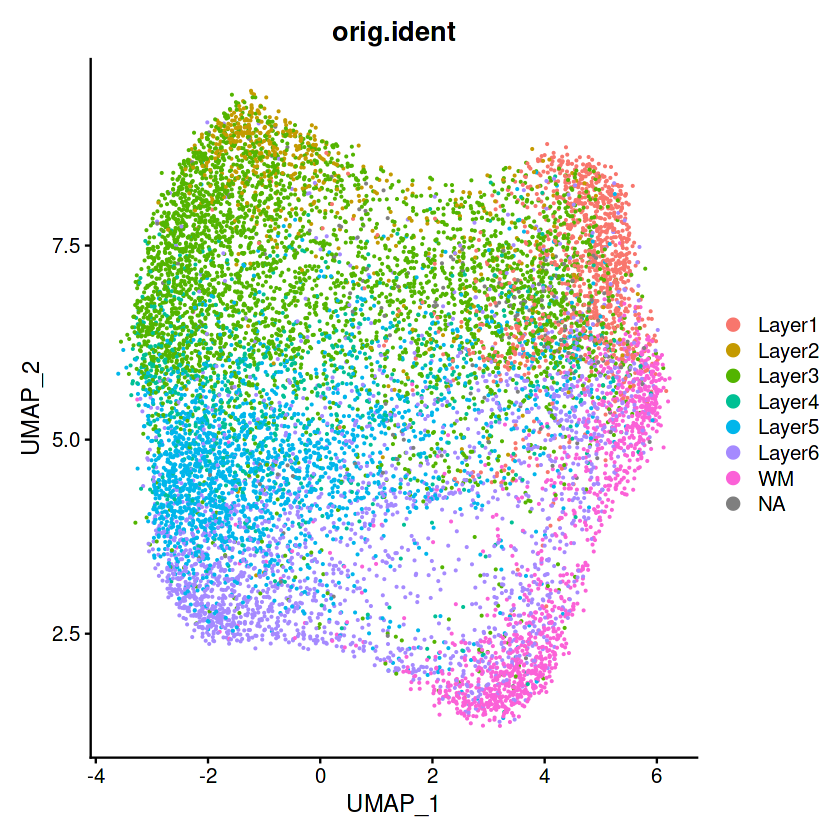

In [28]:
# pbmc <- mybeer$seurat
# PCUSE <- mybeer$select
# pbmc <- RunUMAP(object = pbmc, reduction='pca',dims = PCUSE, umap.method='umap-learn', metric='correlation')

DimPlot(pbmc, reduction='umap', group.by='orig.ident', pt.size=0.1)  

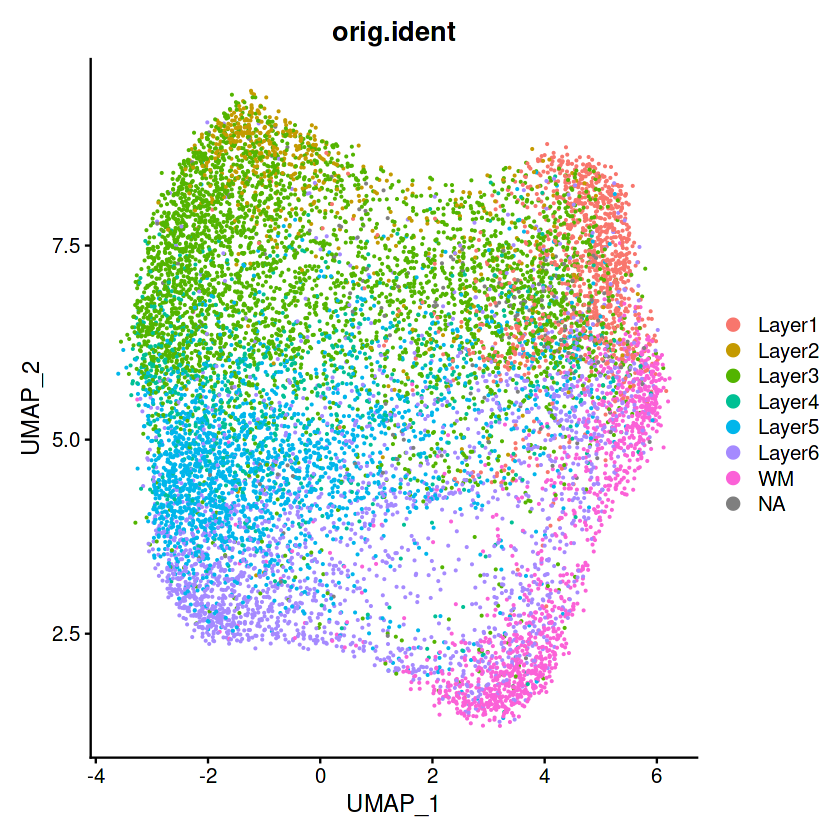

In [28]:
# pbmc <- mybeer$seurat
# PCUSE <- mybeer$select
# pbmc <- RunUMAP(object = pbmc, reduction='pca',dims = PCUSE, umap.method='umap-learn', metric='correlation')

DimPlot(pbmc, reduction='umap', group.by='orig.ident', pt.size=0.1)  

In [29]:
pbmc <- FindNeighbors(object = pbmc)
pbmc <- FindClusters(object = pbmc)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 11880
Number of edges: 337440

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.7559
Number of communities: 10
Elapsed time: 1 seconds


In [30]:
# pbmc <- FindNeighbors(object = pbmc)
pbmc <- FindClusters(object = pbmc, resolution = 0.6)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 11880
Number of edges: 337440

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.7822
Number of communities: 7
Elapsed time: 1 seconds


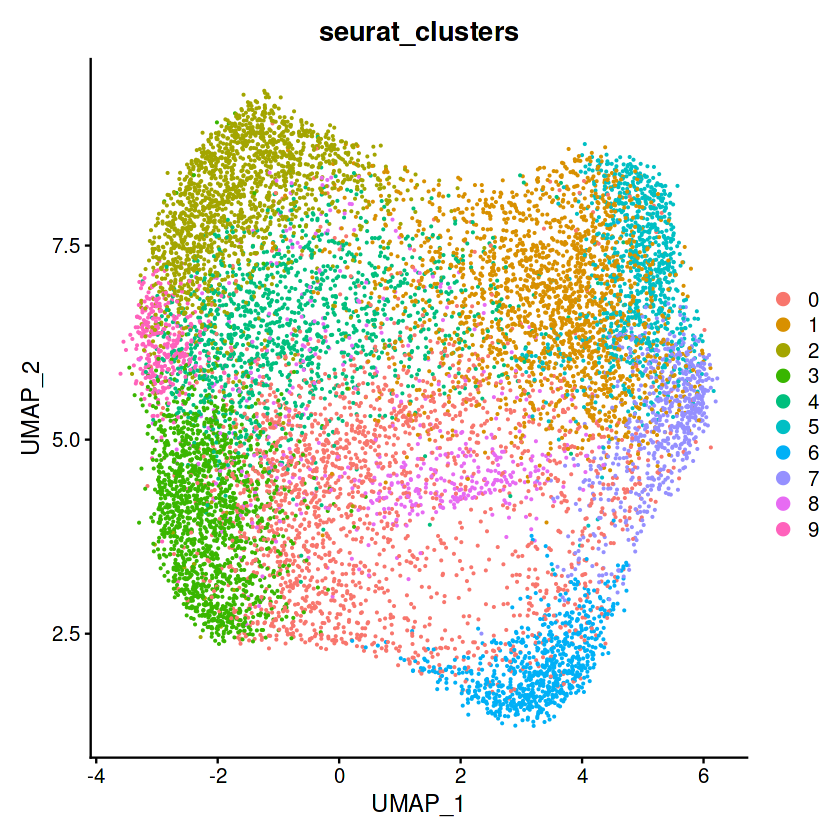

In [31]:
# pbmc <- mybeer$seurat
# PCUSE <- mybeer$select
# pbmc <- RunUMAP(object = pbmc, reduction='pca',dims = PCUSE, umap.method='umap-learn', metric='correlation')

DimPlot(pbmc, reduction='umap', group.by='seurat_clusters', pt.size=0.1)  

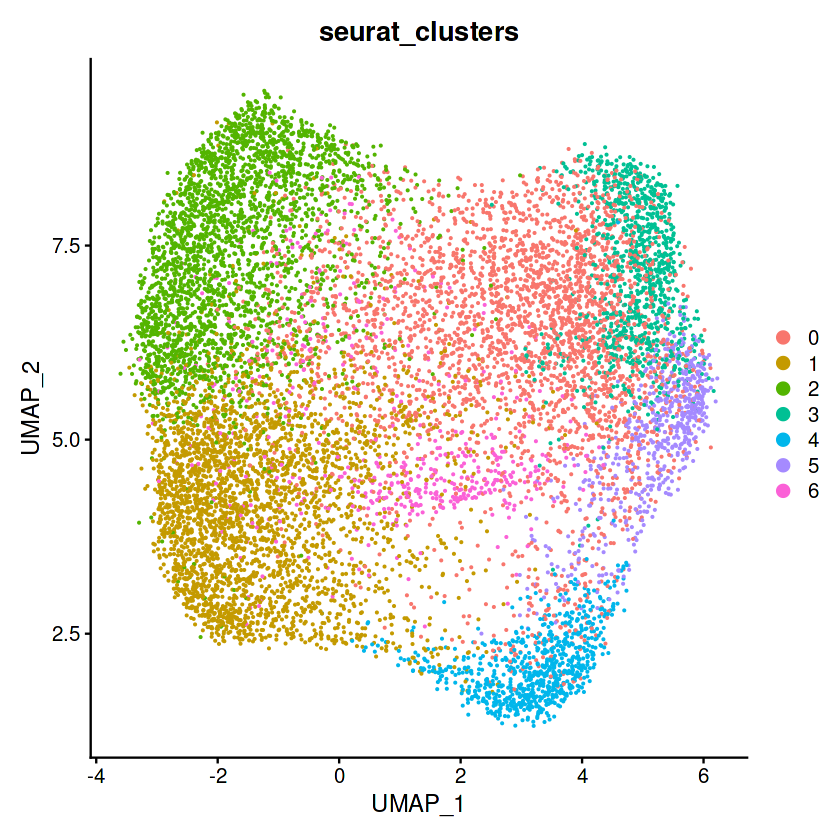

In [31]:
# pbmc <- mybeer$seurat
# PCUSE <- mybeer$select
# pbmc <- RunUMAP(object = pbmc, reduction='pca',dims = PCUSE, umap.method='umap-learn', metric='correlation')

DimPlot(pbmc, reduction='umap', group.by='seurat_clusters', pt.size=0.1)  

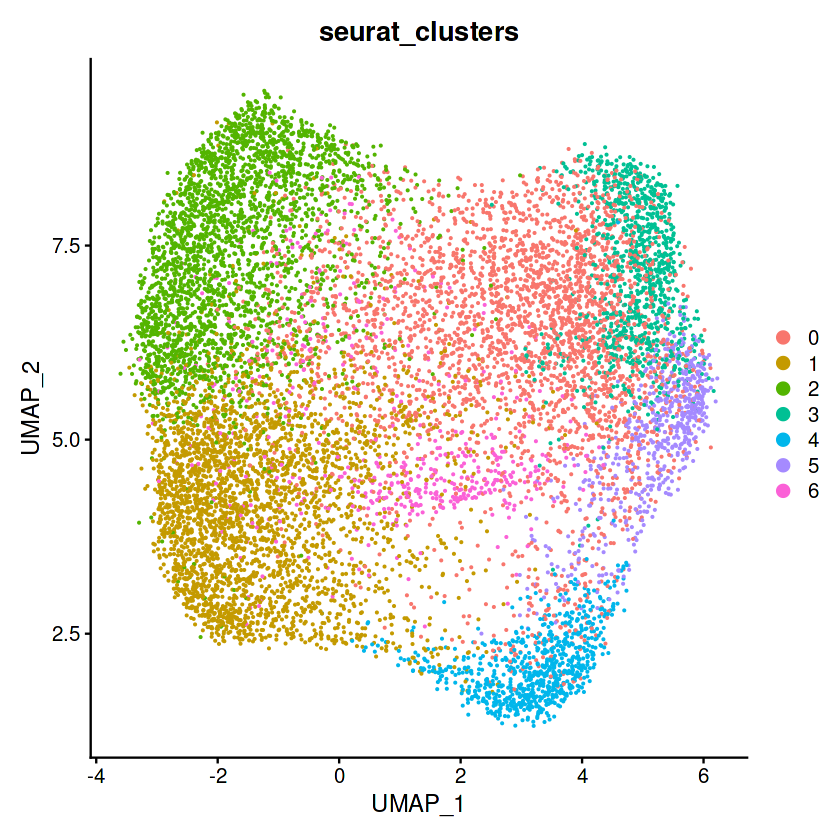

In [31]:
# pbmc <- mybeer$seurat
# PCUSE <- mybeer$select
# pbmc <- RunUMAP(object = pbmc, reduction='pca',dims = PCUSE, umap.method='umap-learn', metric='correlation')

DimPlot(pbmc, reduction='umap', group.by='seurat_clusters', pt.size=0.1)  

In [32]:
clusts <- NULL
for (i in unique(pbmc$seurat_clusters)){
    clusts <- c(clusts, i)    
}
clusts

[1] "3" "1" "4" "6" "2" "0" "5"

In [33]:
ground <- NULL
for (i in unique(pbmc$orig.ident)){
    ground <- c(ground, i)    
}
ground

[1] "Layer1" "Layer3" "WM"     "Layer6" "Layer5" "Layer2" "Layer4" NA

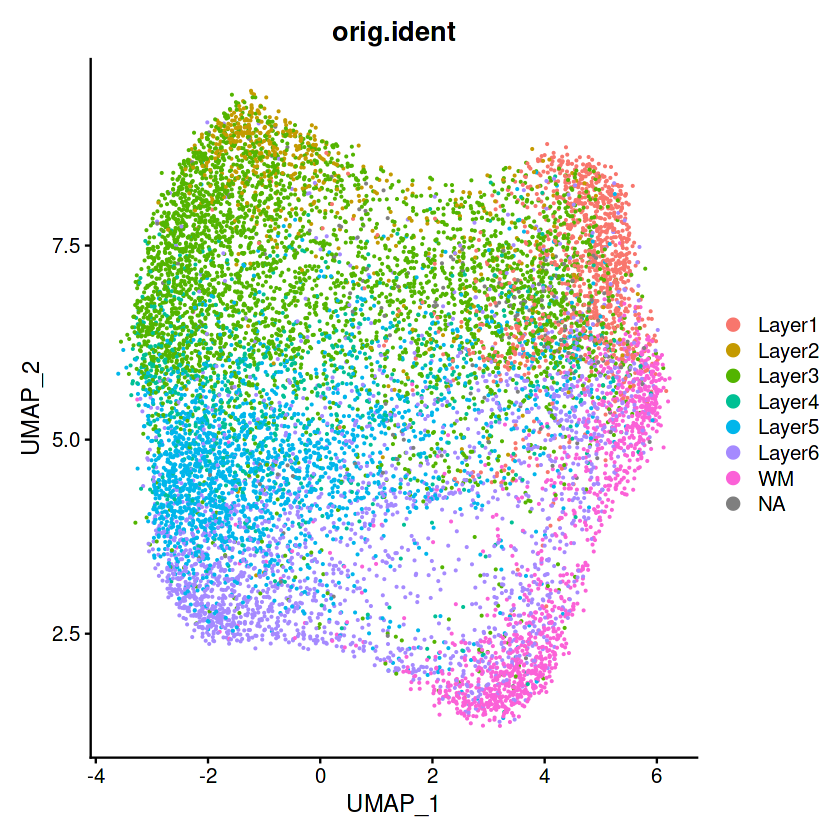


Layer1 Layer2 Layer3 Layer4 Layer5 Layer6     WM 
  1090    558   3779    891   2076   2060   1266 


   0    1    2    3    4    5    6 
3093 3072 2759 1025  794  612  525 

[1] 11880

[1] 11720

[1] 11880

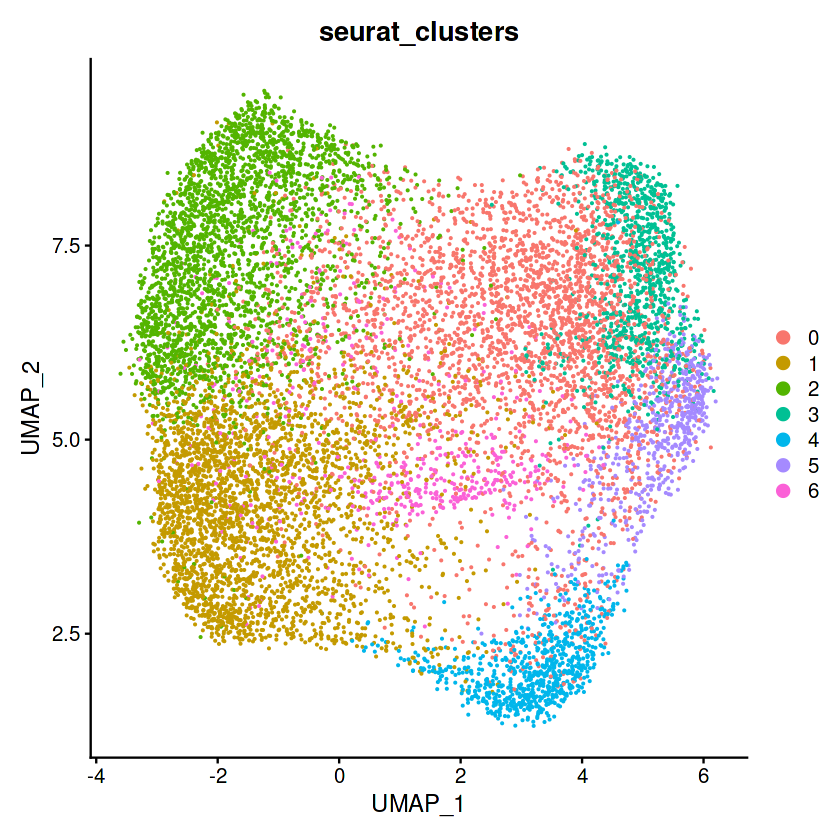

In [60]:
DimPlot(pbmc, reduction='umap',group.by='orig.ident', pt.size=0.1) 
DimPlot(pbmc, reduction='umap',group.by='seurat_clusters', pt.size=0.1) 
table(pbmc$orig.ident)
table(pbmc$seurat_clusters)
sum(table(pbmc$batch))
sum(table(pbmc$orig.ident))
sum(table(pbmc$seurat_clusters))

In [51]:
sum(is.na(pbmc$orig.ident))

[1] 160

In [52]:
na_var <- pbmc[,is.na(pbmc$orig.ident)]
na_var

An object of class Seurat 
67076 features across 160 samples within 1 assay 
Active assay: RNA (67076 features, 1934 variable features)
 2 dimensional reductions calculated: pca, umap

In [56]:
nona_var <- pbmc[,!is.na(pbmc$orig.ident)]
nona_var

An object of class Seurat 
67076 features across 11720 samples within 1 assay 
Active assay: RNA (67076 features, 1934 variable features)
 2 dimensional reductions calculated: pca, umap

In [84]:
D1_nona <- nona_var[,nona_var$batch=='D1']
D2_nona <- nona_var[,nona_var$batch=='D2']
D3_nona <- nona_var[,nona_var$batch=='D3']

In [93]:
score <- ARI(nona_var$seurat_clusters,nona_var$orig.ident)
print(c('combined ARI score: ', score))

[1] "combined ARI score: " "0.264870933530887"   


In [100]:
score <- ARI(D1_nona$seurat_clusters,D1_nona$orig.ident)
print(c('D1 ARI score: ', score))

[1] "D1 ARI score: "    "0.269165511336864"


In [101]:
score <- ARI(D2_nona$seurat_clusters,D2_nona$orig.ident)
print(c('D2 ARI score: ', score))

[1] "D2 ARI score: "   "0.27748532069322"


In [102]:
score <- ARI(D3_nona$seurat_clusters,D3_nona$orig.ident)
print(c('D3 ARI score: ', score))

[1] "D3 ARI score: "    "0.405224005514666"


<h3>.D1 only without batch effect removal

Centering and scaling data matrix

PC_ 1 
Positive:  ENSG00000131095 
Negative:  ENSG00000277586 



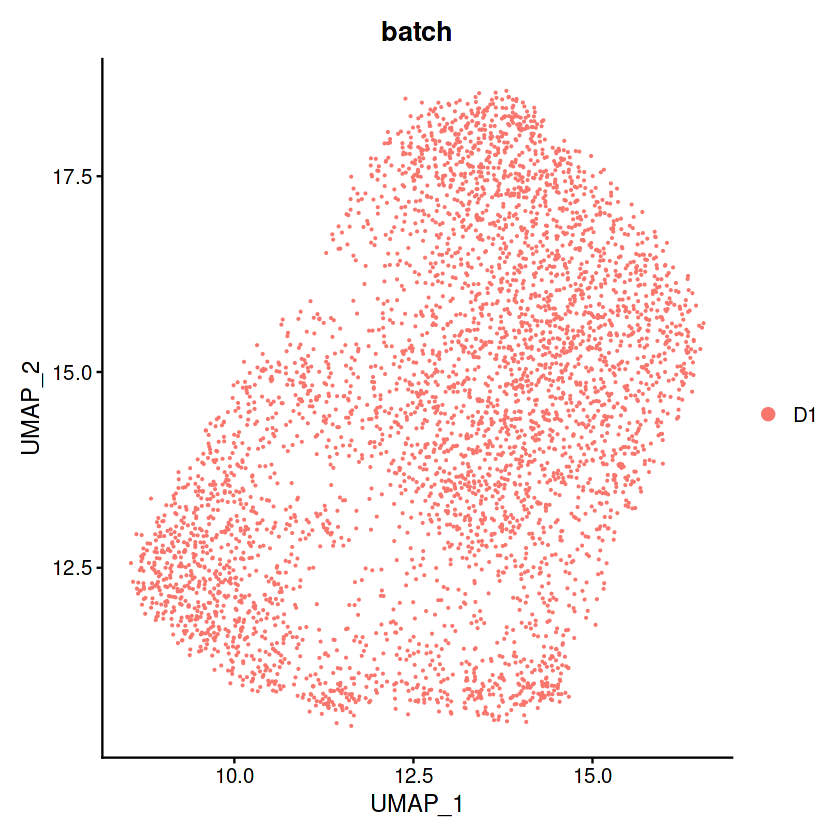

In [124]:
pbmc_batch=CreateSeuratObject(counts = D1, min.cells = 0, min.features = 0, project = "ALL") 
pbmc_batch@meta.data$batch='D1'
pbmc_batch@meta.data$orig.ident=colData(spe_507)$'layer_guess'
pbmc_batch=FindVariableFeatures(object = pbmc_batch, selection.method = "vst", nfeatures = 2000)   
# VariableFeatures(object = pbmc_batch)
pbmc_batch <- NormalizeData(object = pbmc_batch, normalization.method = "LogNormalize", scale.factor = 10000)
pbmc_batch <- ScaleData(object = pbmc_batch, features = VariableFeatures(object = pbmc_batch))
pbmc_batch <- RunPCA(object = pbmc_batch, seed.use=123, npcs=50, features = VariableFeatures(object = pbmc_batch), ndims.print=1,nfeatures.print=1)
pbmc_batch <- RunUMAP(pbmc_batch, dims = 1:50, seed.use = 123,n.components=2, umap.method = "umap-learn",  metric="correlation")
DimPlot(pbmc_batch, reduction='umap', group.by='batch', pt.size=0.1) 

In [125]:
pbmc_batch <- FindNeighbors(object = pbmc_batch)
pbmc_batch <- FindClusters(object = pbmc_batch, resolution = 0.5)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 4226
Number of edges: 135717

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.7941
Number of communities: 5
Elapsed time: 0 seconds


In [126]:
pbmc_batch <- FindClusters(object = pbmc_batch, resolution = 0.6)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 4226
Number of edges: 135717

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.7767
Number of communities: 7
Elapsed time: 0 seconds


In [127]:
nona_batch <- pbmc_batch[,!is.na(pbmc_batch$orig.ident)]
nona_batch

An object of class Seurat 
33538 features across 4221 samples within 1 assay 
Active assay: RNA (33538 features, 2000 variable features)
 2 dimensional reductions calculated: pca, umap

In [128]:
score <- ARI(nona_batch$seurat_clusters, nona_batch$orig.ident)
print(c('before batch effect removal combined ARI score: ', score))

[1] "before batch effect removal combined ARI score: "
[2] "0.336207521836288"                               


<h3>D2 only without batch effect removal

Centering and scaling data matrix

PC_ 1 
Positive:  ENSG00000110484 
Negative:  ENSG00000212907 



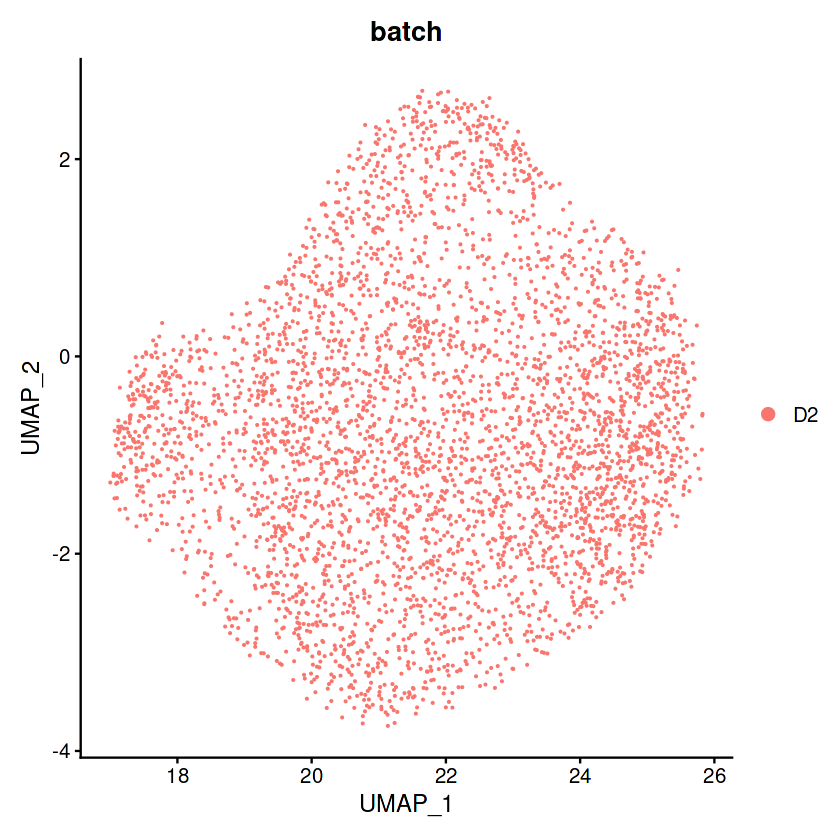

In [135]:
pbmc_batch=CreateSeuratObject(counts = D2, min.cells = 0, min.features = 0, project = "ALL") 
pbmc_batch@meta.data$batch='D2'
pbmc_batch@meta.data$orig.ident=colData(spe_672)$'layer_guess'
pbmc_batch=FindVariableFeatures(object = pbmc_batch, selection.method = "vst", nfeatures = 2000)   
# VariableFeatures(object = pbmc_batch)
pbmc_batch <- NormalizeData(object = pbmc_batch, normalization.method = "LogNormalize", scale.factor = 10000)
pbmc_batch <- ScaleData(object = pbmc_batch, features = VariableFeatures(object = pbmc_batch))
pbmc_batch <- RunPCA(object = pbmc_batch, seed.use=123, npcs=50, features = VariableFeatures(object = pbmc_batch), ndims.print=1,nfeatures.print=1)
pbmc_batch <- RunUMAP(pbmc_batch, dims = 1:50, seed.use = 123,n.components=2, umap.method = "umap-learn",  metric="correlation")
DimPlot(pbmc_batch, reduction='umap', group.by='batch', pt.size=0.1) 

In [136]:
pbmc_batch <- FindNeighbors(object = pbmc_batch)
pbmc_batch <- FindClusters(object = pbmc_batch, resolution = 0.5)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 4015
Number of edges: 124992

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.7433
Number of communities: 6
Elapsed time: 0 seconds


In [137]:
pbmc_batch <- FindClusters(object = pbmc_batch, resolution = 0.6)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 4015
Number of edges: 124992

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.7239
Number of communities: 7
Elapsed time: 0 seconds


In [138]:
nona_batch <- pbmc_batch[,!is.na(pbmc_batch$orig.ident)]
nona_batch

An object of class Seurat 
33538 features across 3888 samples within 1 assay 
Active assay: RNA (33538 features, 2000 variable features)
 2 dimensional reductions calculated: pca, umap

In [139]:
score <- ARI(nona_batch$seurat_clusters, nona_batch$orig.ident)
print(c('before batch effect removal combined ARI score: ', score))

[1] "before batch effect removal combined ARI score: "
[2] "0.244248571653617"                               


<h3>D3 only without batch effect removal

Centering and scaling data matrix

PC_ 1 
Positive:  ENSG00000171617 
Negative:  ENSG00000168314 



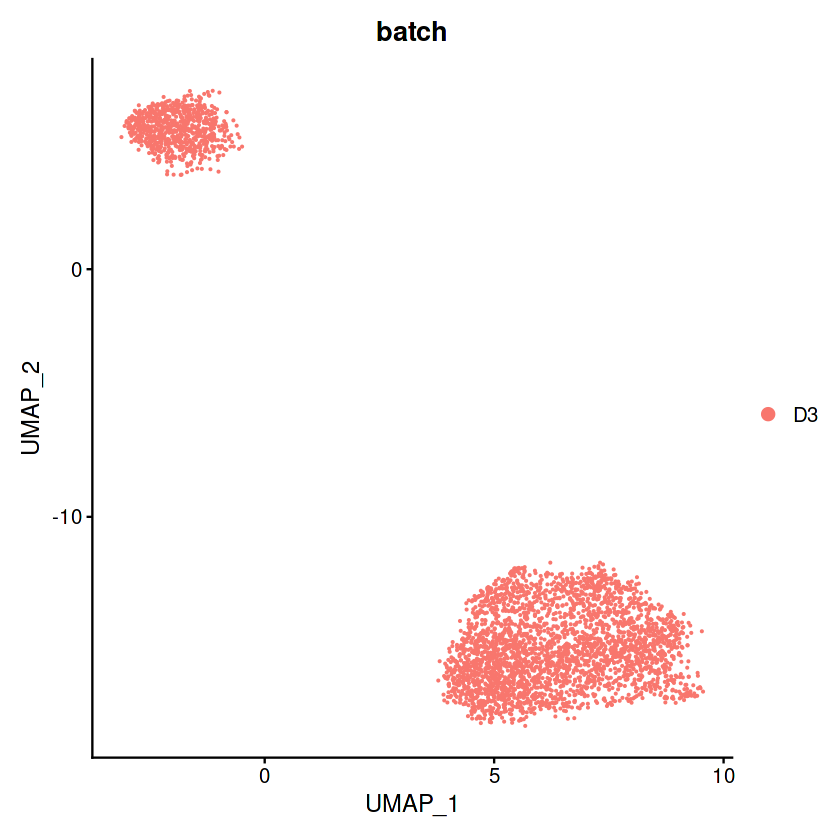

In [129]:
pbmc_batch=CreateSeuratObject(counts = D3, min.cells = 0, min.features = 0, project = "ALL") 
pbmc_batch@meta.data$batch='D3'
pbmc_batch@meta.data$orig.ident=colData(spe_673)$'layer_guess'
pbmc_batch=FindVariableFeatures(object = pbmc_batch, selection.method = "vst", nfeatures = 2000)   
# VariableFeatures(object = pbmc_batch)
pbmc_batch <- NormalizeData(object = pbmc_batch, normalization.method = "LogNormalize", scale.factor = 10000)
pbmc_batch <- ScaleData(object = pbmc_batch, features = VariableFeatures(object = pbmc_batch))
pbmc_batch <- RunPCA(object = pbmc_batch, seed.use=123, npcs=50, features = VariableFeatures(object = pbmc_batch), ndims.print=1,nfeatures.print=1)
pbmc_batch <- RunUMAP(pbmc_batch, dims = 1:50, seed.use = 123,n.components=2, umap.method = "umap-learn",  metric="correlation")
DimPlot(pbmc_batch, reduction='umap', group.by='batch', pt.size=0.1) 

In [130]:
pbmc_batch <- FindNeighbors(object = pbmc_batch)
pbmc_batch <- FindClusters(object = pbmc_batch, resolution = 0.5)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 3639
Number of edges: 122436

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.7896
Number of communities: 5
Elapsed time: 0 seconds


In [132]:
pbmc_batch <- FindClusters(object = pbmc_batch, resolution = 0.65)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 3639
Number of edges: 122436

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.7582
Number of communities: 7
Elapsed time: 0 seconds


In [133]:
nona_batch <- pbmc_batch[,!is.na(pbmc_batch$orig.ident)]
nona_batch

An object of class Seurat 
33538 features across 3611 samples within 1 assay 
Active assay: RNA (33538 features, 2000 variable features)
 2 dimensional reductions calculated: pca, umap

In [134]:
score <- ARI(nona_batch$seurat_clusters, nona_batch$orig.ident)
print(c('before batch effect removal combined ARI score: ', score))

[1] "before batch effect removal combined ARI score: "
[2] "0.236880789223194"                               


<h3>Combined without batch effect removal

Warning message:
“Non-unique cell names (colnames) present in the input matrix, making unique”
Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Centering and scaling data matrix

PC_ 1 
Positive:  ENSG00000175874 
Negative:  ENSG00000204792-spat 



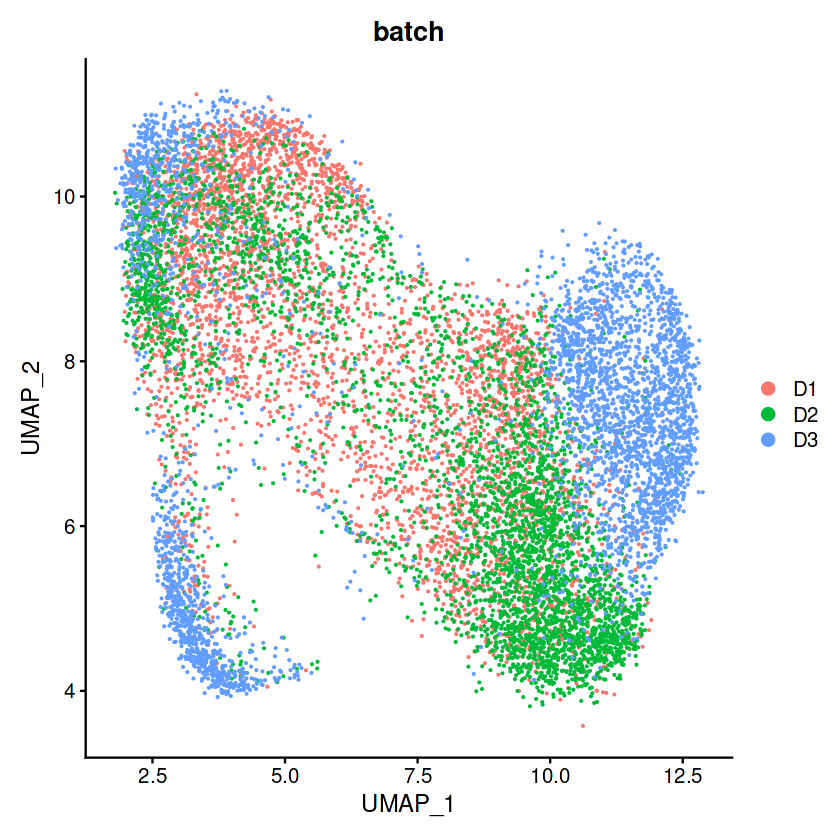

In [103]:
pbmc_batch=CreateSeuratObject(counts = DATA, min.cells = 0, min.features = 0, project = "ALL") 
pbmc_batch@meta.data$batch=BATCH
pbmc_batch@meta.data$orig.ident=char_layer
pbmc_batch=FindVariableFeatures(object = pbmc_batch, selection.method = "vst", nfeatures = 2000)   
# VariableFeatures(object = pbmc_batch)
pbmc_batch <- NormalizeData(object = pbmc_batch, normalization.method = "LogNormalize", scale.factor = 10000)
pbmc_batch <- ScaleData(object = pbmc_batch, features = VariableFeatures(object = pbmc_batch))
pbmc_batch <- RunPCA(object = pbmc_batch, seed.use=123, npcs=50, features = VariableFeatures(object = pbmc_batch), ndims.print=1,nfeatures.print=1)
pbmc_batch <- RunUMAP(pbmc_batch, dims = 1:50, seed.use = 123,n.components=2, umap.method = "umap-learn",  metric="correlation")
DimPlot(pbmc_batch, reduction='umap', group.by='batch', pt.size=0.1) 

In [104]:
pbmc_batch <- FindNeighbors(object = pbmc_batch)
pbmc_batch <- FindClusters(object = pbmc_batch, resolution = 0.425)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 11880
Number of edges: 356480

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8408
Number of communities: 7
Elapsed time: 1 seconds


In [110]:
nona_batch <- pbmc_batch[,!is.na(pbmc_batch$orig.ident)]
nona_batch

An object of class Seurat 
67076 features across 11720 samples within 1 assay 
Active assay: RNA (67076 features, 2000 variable features)
 2 dimensional reductions calculated: pca, umap

In [105]:
D1_nona_batch <- nona_batch[,nona_batch$batch=='D1']
D2_nona_batch <- nona_batch[,nona_batch$batch=='D2']
D3_nona_batch <- nona_batch[,nona_batch$batch=='D3']

In [106]:
score <- ARI(nona_batch$seurat_clusters, nona_batch$orig.ident)
print(c('before batch effect removal combined ARI score: ', score))

[1] "before batch effect removal combined ARI score: "
[2] "0.1267810736034"                                 


In [107]:
score <- ARI(D1_nona_batch$seurat_clusters, D1_nona_batch$orig.ident)
print(c('before batch effect removal D1 ARI score: ', score))

[1] "before batch effect removal D1 ARI score: "
[2] "0.169137448403465"                         


In [108]:
score <- ARI(D2_nona_batch$seurat_clusters, D2_nona_batch$orig.ident)
print(c('before batch effect removal D2 ARI score: ', score))

[1] "before batch effect removal D2 ARI score: "
[2] "0.158465902120202"                         


In [109]:
score <- ARI(D3_nona_batch$seurat_clusters, D3_nona_batch$orig.ident)
print(c('before batch effect removal D3 ARI score: ', score))

[1] "before batch effect removal D3 ARI score: "
[2] "0.21733896594168"                          



Layer1 Layer2 Layer3 Layer4 Layer5 Layer6     WM 
   817    305   1215    369    675    486    354 

[1] 4226

[1] 4221

[1] 4226

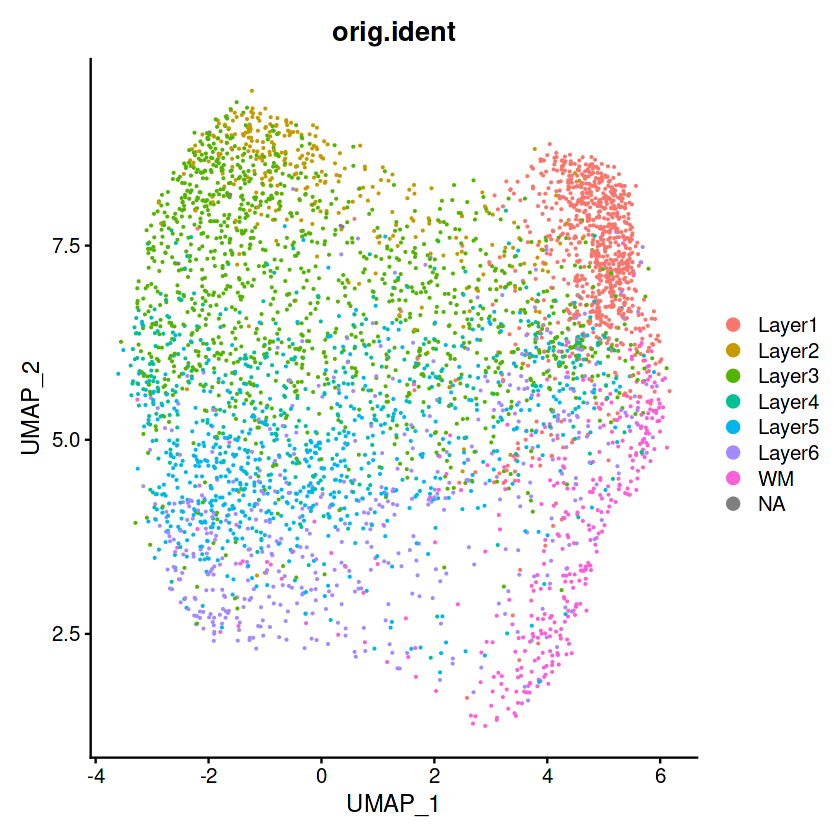

In [75]:
test <- pbmc[,pbmc$batch=='D1']
DimPlot(test, reduction='umap',group.by='orig.ident', pt.size=0.1) 
table(test$orig.ident)
sum(table(test$batch))
sum(table(test$orig.ident))
sum(table(test$seurat_clusters))


Layer3 Layer4 Layer5 Layer6     WM 
  1575    304    728    882    399 

[1] 4015

[1] 3888

[1] 4015

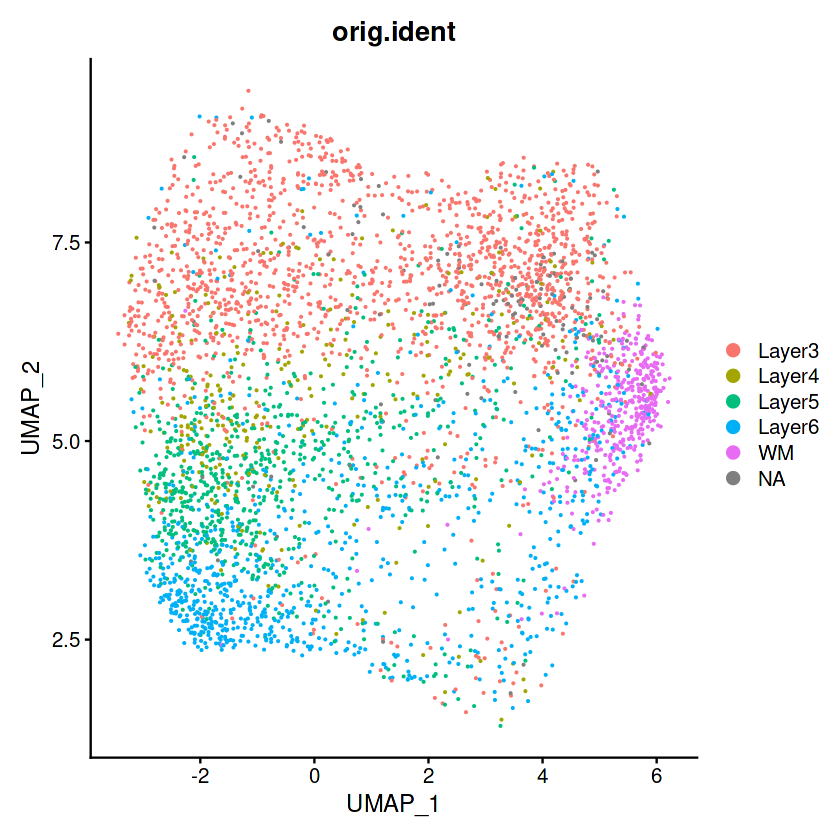

In [76]:
test <- pbmc[,pbmc$batch=='D2']
DimPlot(test, reduction='umap',group.by='orig.ident', pt.size=0.1) 
table(test$orig.ident)
sum(table(test$batch))
sum(table(test$orig.ident))
sum(table(test$seurat_clusters))


Layer1 Layer2 Layer3 Layer4 Layer5 Layer6     WM 
   273    253    989    218    673    692    513 

[1] 3639

[1] 3611

[1] 3639

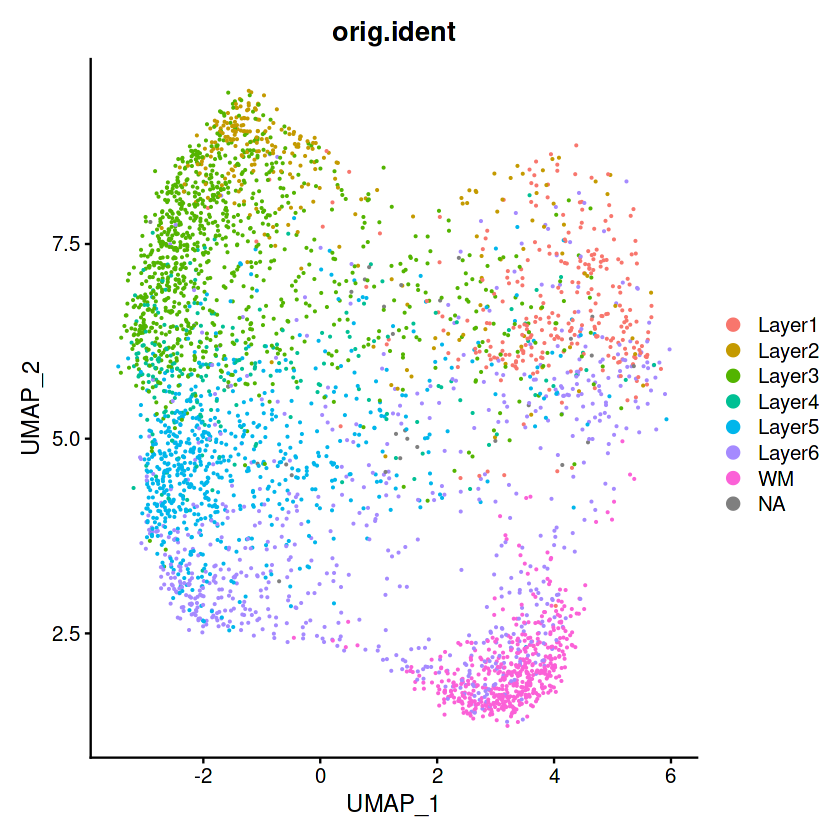

In [77]:
test <- pbmc[,pbmc$batch=='D3']
DimPlot(test, reduction='umap',group.by='orig.ident', pt.size=0.1) 
table(test$orig.ident)
sum(table(test$batch))
sum(table(test$orig.ident))
sum(table(test$seurat_clusters))

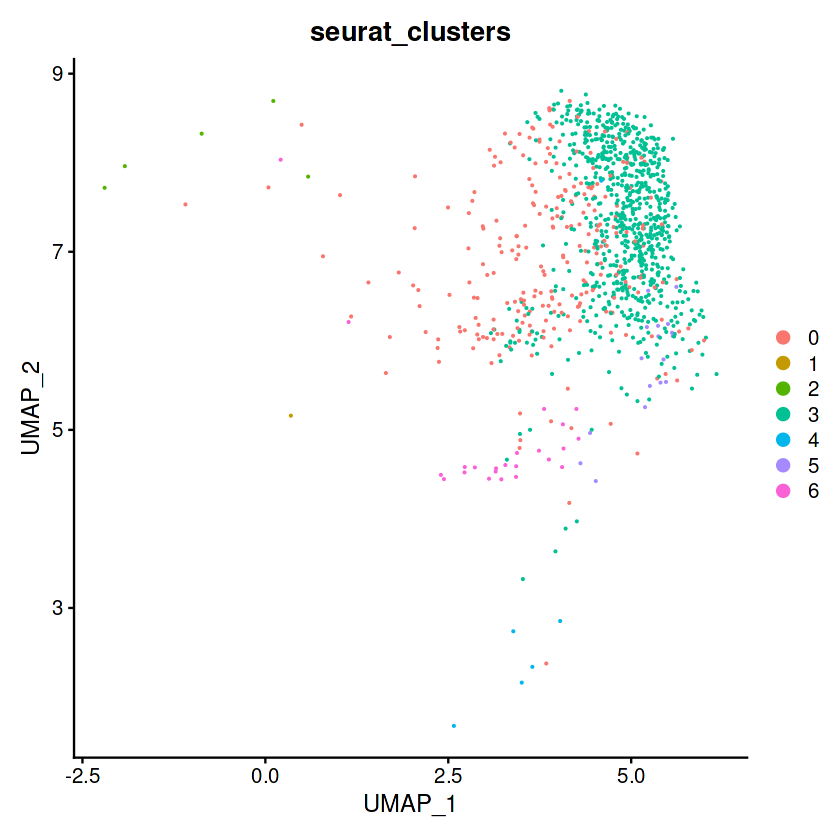

In [85]:
test <- pbmc[,pbmc$orig.ident==ground[1]]
DimPlot(test, reduction='umap',group.by='seurat_clusters', pt.size=0.1)  

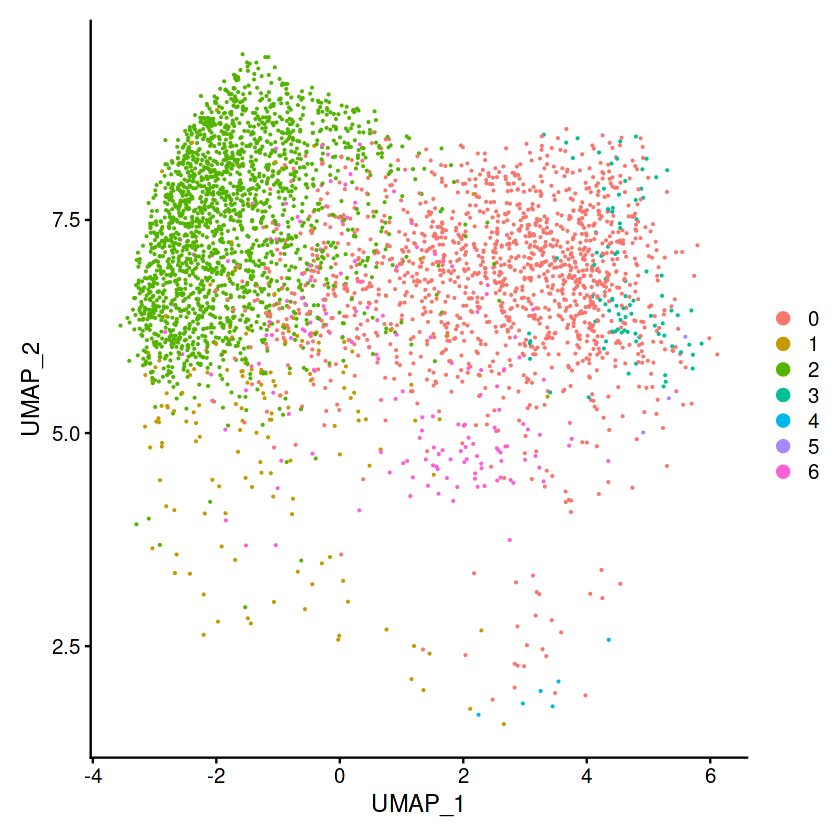

In [86]:
test <- pbmc[,pbmc$orig.ident==ground[2]]
DimPlot(test, reduction='umap', pt.size=0.1)  

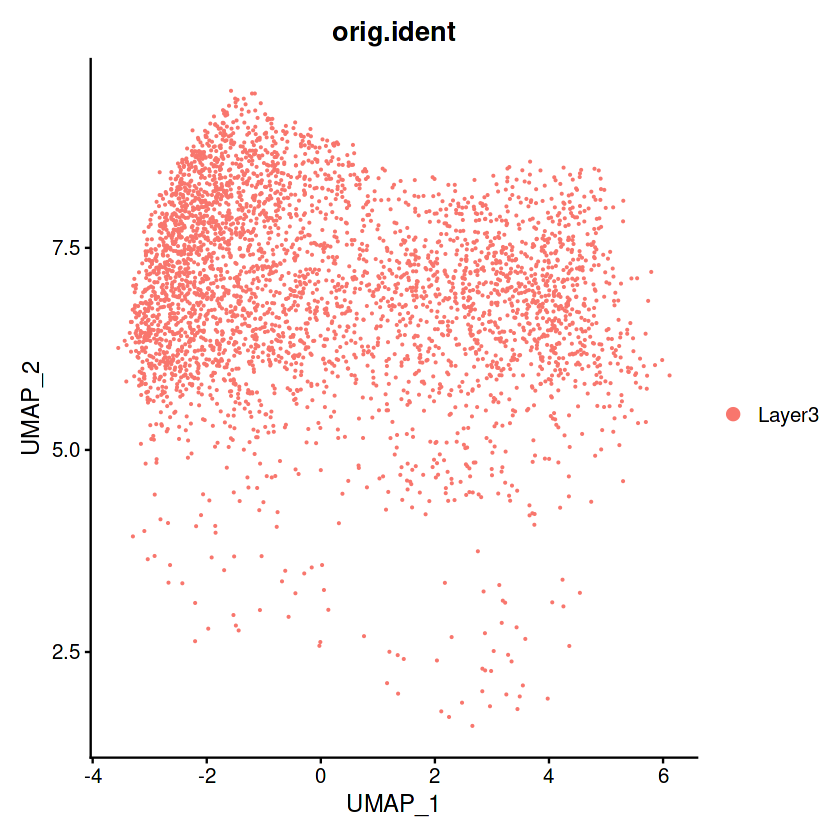

In [47]:
test <- pbmc[,pbmc$orig.ident==ground[2]]
DimPlot(test, reduction='umap',group.by='orig.ident', pt.size=0.1)  

[1] "3"



Layer1 Layer2 Layer3 Layer4 Layer5 Layer6     WM 
   779     12     90     19     21     48     45 

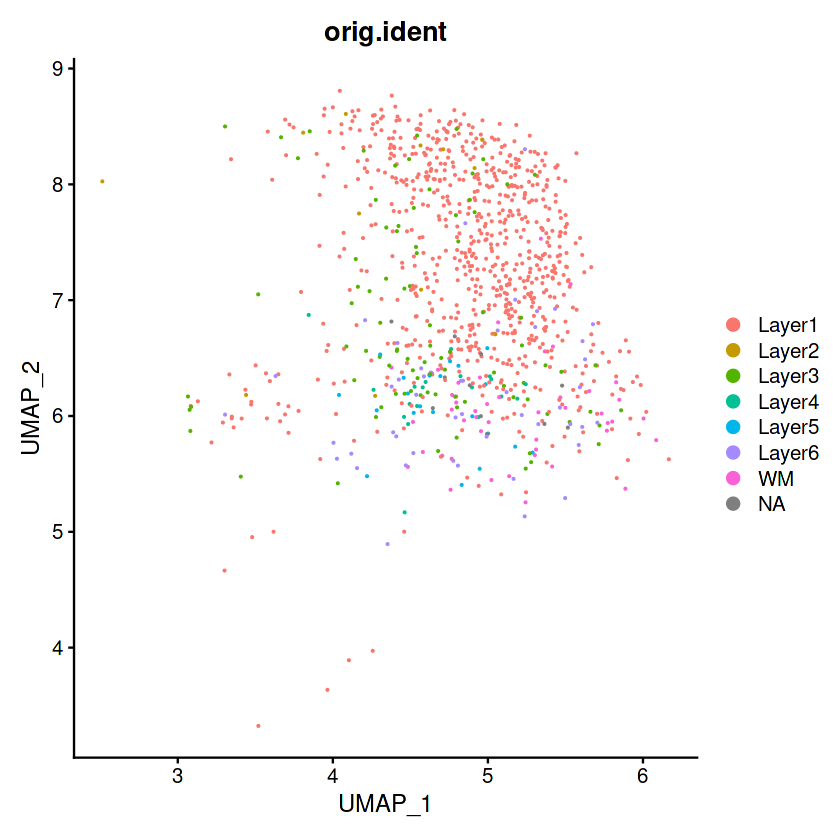

In [87]:
print(clusts[1])
test <- pbmc[,pbmc$seurat_clusters==clusts[1]]
DimPlot(test, reduction='umap', group.by='orig.ident', pt.size=0.1)  
table(test$orig.ident)

[1] "1"



Layer1 Layer2 Layer3 Layer4 Layer5 Layer6     WM 
     1      7    163    280   1440   1129     39 

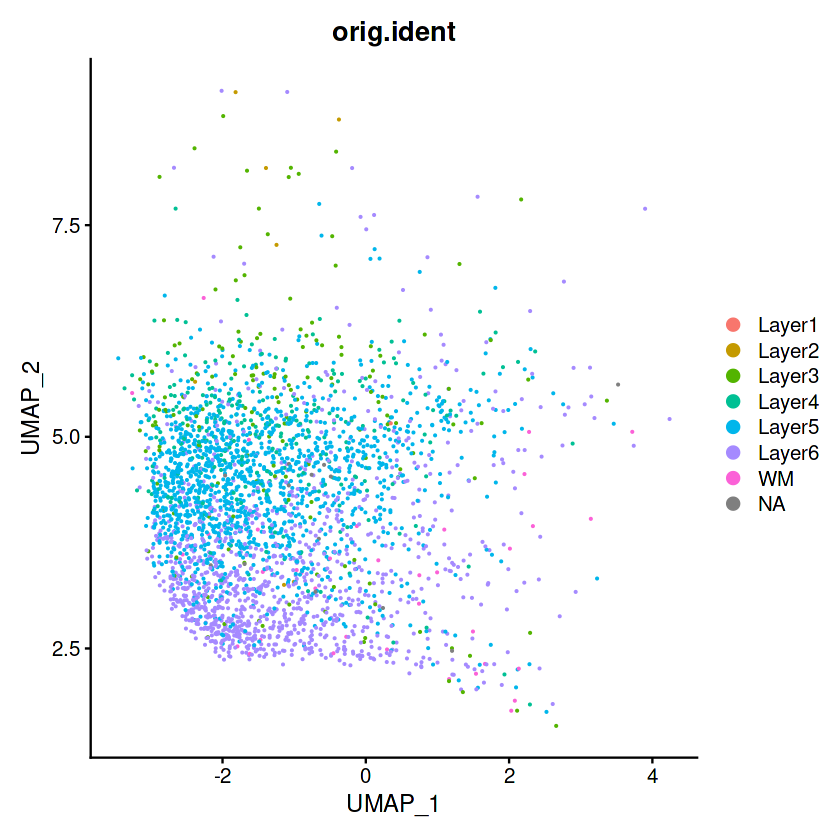

In [88]:
print(clusts[2])
test <- pbmc[,pbmc$seurat_clusters==clusts[2]]
DimPlot(test, reduction='umap', group.by='orig.ident', pt.size=0.1)   
table(test$orig.ident)

[1] "4"



Layer1 Layer3 Layer4 Layer5 Layer6     WM 
     6      6      2     17    167    594 

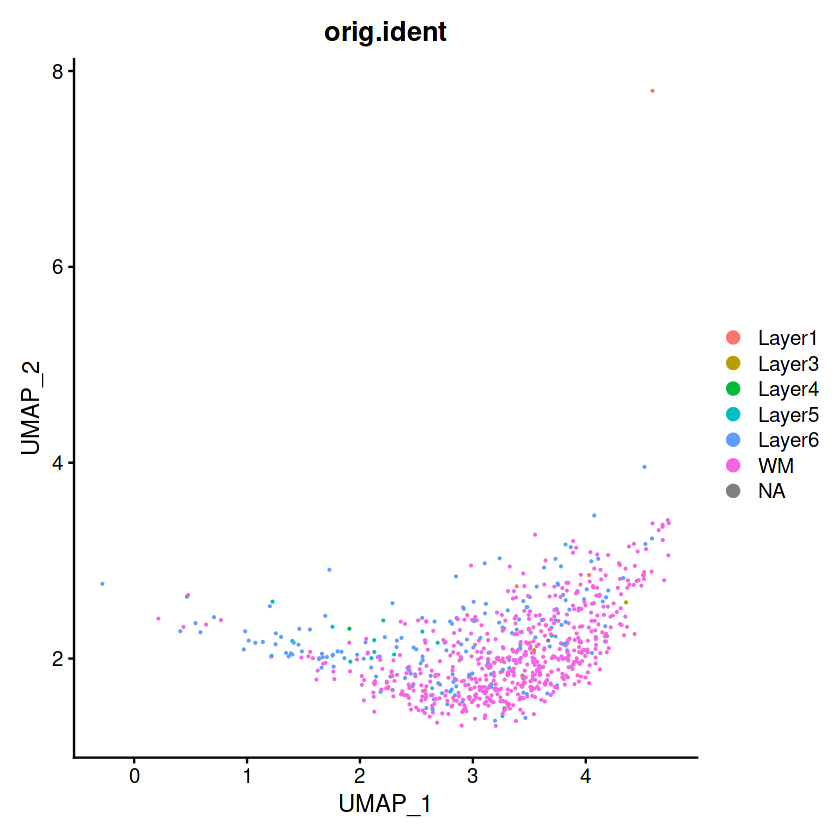

In [89]:
print(clusts[3])
test <- pbmc[,pbmc$seurat_clusters==clusts[3]]
DimPlot(test, reduction='umap', group.by='orig.ident', pt.size=0.1)
table(test$orig.ident)

In [65]:
D1_sub <- pbmc[,pbmc$batch=='D1']
unique(D1_sub$orig.ident)

[1] "Layer1" "Layer3" "WM"     "Layer6" "Layer5" "Layer2" "Layer4" NA

In [66]:
D2_sub <- pbmc[,pbmc$batch=='D2']
unique(D2_sub$orig.ident)

[1] "Layer5" "Layer6" "Layer3" "Layer4" "WM"     NA

In [67]:
D3_sub <- pbmc[,pbmc$batch=='D3']
unique(D3_sub$orig.ident)

[1] "Layer3" "Layer1" "WM"     "Layer5" "Layer6" "Layer2" "Layer4" NA

In [54]:
param <- 'com3_unfil_umap_plot_gg_0919_gnum50_pc30_GN1000_R2.png'
par_only <- '_gnum50_pc30_GN1000_R2.png'

In [29]:
layer <- paste('layer',param,sep='_')

In [67]:
umap_plot <- DimPlot(pbmc, reduction='umap', group.by='batch', pt.size=0.1) 
ggsave(param,umap_plot)

Saving 6.67 x 6.67 in image


In [68]:
umap_plot <- DimPlot(pbmc, reduction='umap', group.by='orig.ident', pt.size=0.1) 
ggsave(layer,umap_plot)

Saving 6.67 x 6.67 in image


In [30]:
png(paste('com3_unfil_corr_plot_0809',par_only))
plot(mybeer$cor,mybeer$lcor,pch=16,col=COL,
    xlab='Rank Correlation',ylab='Linear Correlation',xlim=c(0,1),ylim=c(0,1))
dev.off()

png 
  2

Centering and scaling data matrix

PC_ 1 
Positive:  3457 
Negative:  ENSG00000142192 



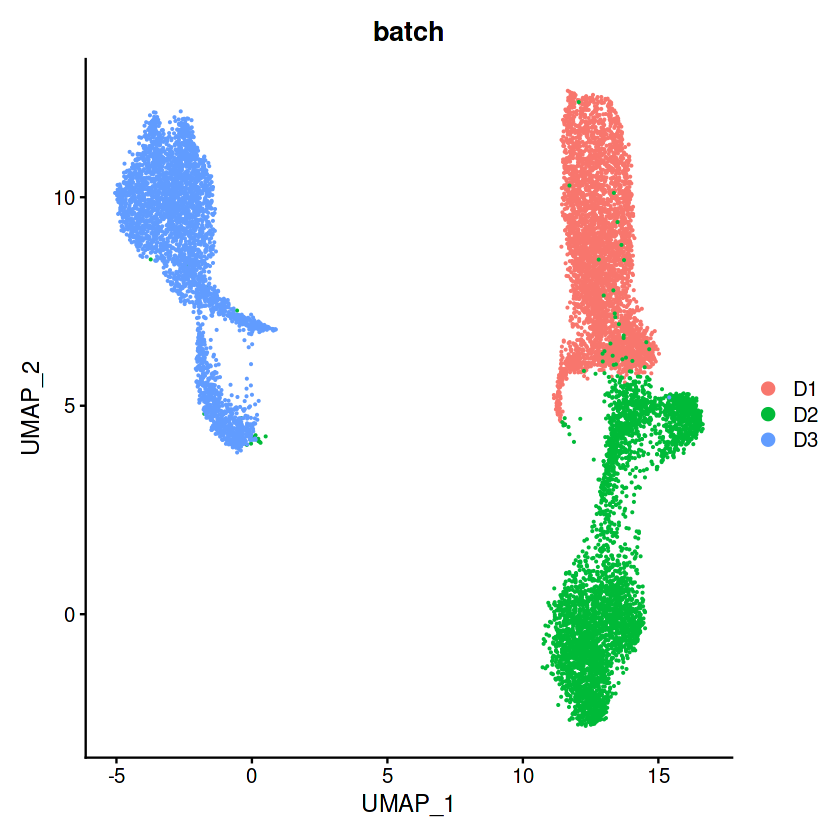

In [36]:
pbmc_batch=CreateSeuratObject(counts = DATA, min.cells = 0, min.features = 0, project = "ALL") 
pbmc_batch@meta.data$batch=BATCH
pbmc_batch@meta.data$orig.ident=char_layer
pbmc_batch=FindVariableFeatures(object = pbmc_batch, selection.method = "vst", nfeatures = 2000)   
# VariableFeatures(object = pbmc_batch)
pbmc_batch <- NormalizeData(object = pbmc_batch, normalization.method = "LogNormalize", scale.factor = 10000)
pbmc_batch <- ScaleData(object = pbmc_batch, features = VariableFeatures(object = pbmc_batch))
pbmc_batch <- RunPCA(object = pbmc_batch, seed.use=123, npcs=50, features = VariableFeatures(object = pbmc_batch), ndims.print=1,nfeatures.print=1)
pbmc_batch <- RunUMAP(pbmc_batch, dims = 1:50, seed.use = 123,n.components=2, umap.method = "umap-learn",  metric="correlation")
DimPlot(pbmc_batch, reduction='umap', group.by='batch', pt.size=0.1) 

Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Centering and scaling data matrix

PC_ 1 
Positive:  ENSG00000175874 
Negative:  ENSG00000204792-spat 



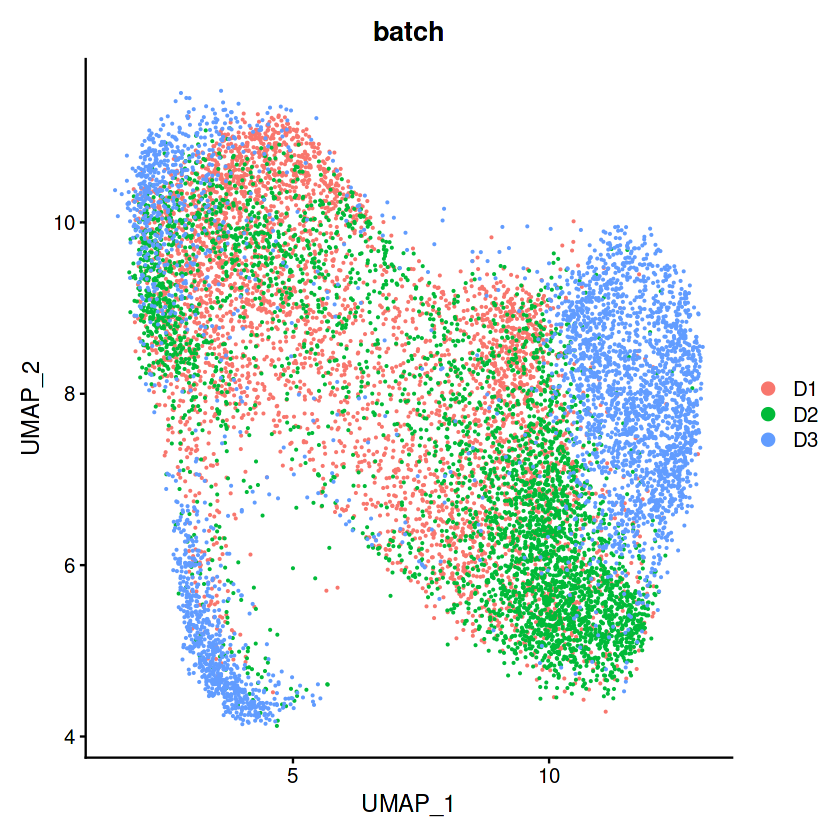

In [31]:
pbmc_batch=CreateSeuratObject(counts = DATA, min.cells = 0, min.features = 0, project = "ALL") 
pbmc_batch@meta.data$batch=BATCH
pbmc_batch@meta.data$orig.ident=char_layer
pbmc_batch=FindVariableFeatures(object = pbmc_batch, selection.method = "vst", nfeatures = 2000)   
# VariableFeatures(object = pbmc_batch)
pbmc_batch <- NormalizeData(object = pbmc_batch, normalization.method = "LogNormalize", scale.factor = 10000)
pbmc_batch <- ScaleData(object = pbmc_batch, features = VariableFeatures(object = pbmc_batch))
pbmc_batch <- RunPCA(object = pbmc_batch, seed.use=123, npcs=50, features = VariableFeatures(object = pbmc_batch), ndims.print=1,nfeatures.print=1)
pbmc_batch <- RunUMAP(pbmc_batch, dims = 1:50, seed.use = 123,n.components=2, umap.method = "umap-learn",  metric="correlation")
DimPlot(pbmc_batch, reduction='umap', group.by='batch', pt.size=0.1) 

Warning message:
“Non-unique cell names (colnames) present in the input matrix, making unique”
Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Centering and scaling data matrix

PC_ 1 
Positive:  ENSG00000175874 
Negative:  ENSG00000204792-spat 



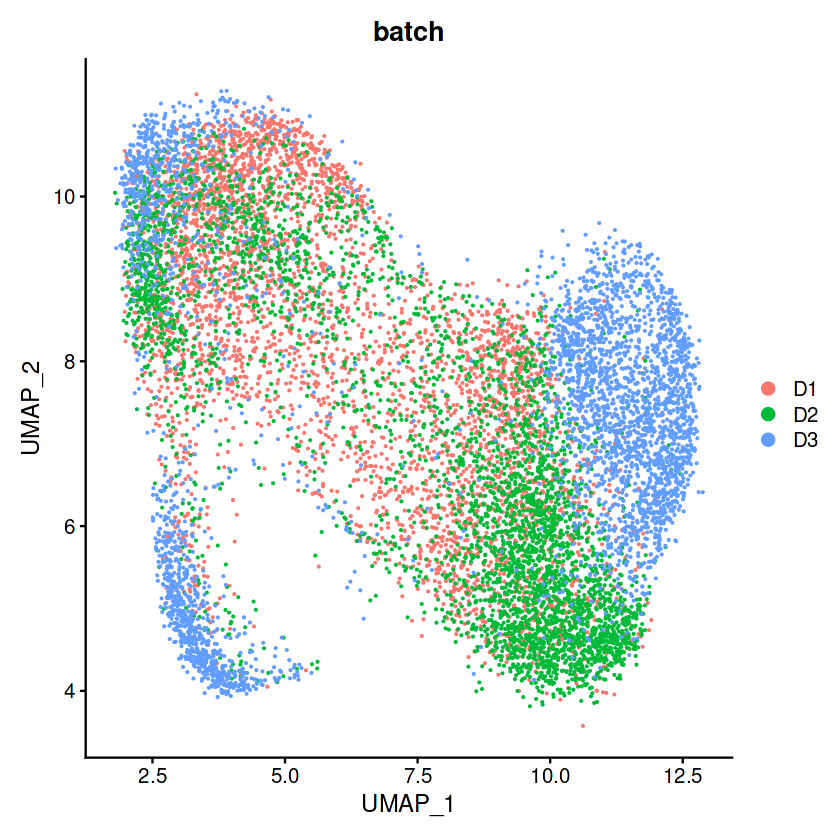

In [61]:
pbmc_batch=CreateSeuratObject(counts = DATA, min.cells = 0, min.features = 0, project = "ALL") 
pbmc_batch@meta.data$batch=BATCH
pbmc_batch@meta.data$orig.ident=char_layer
pbmc_batch=FindVariableFeatures(object = pbmc_batch, selection.method = "vst", nfeatures = 2000)   
# VariableFeatures(object = pbmc_batch)
pbmc_batch <- NormalizeData(object = pbmc_batch, normalization.method = "LogNormalize", scale.factor = 10000)
pbmc_batch <- ScaleData(object = pbmc_batch, features = VariableFeatures(object = pbmc_batch))
pbmc_batch <- RunPCA(object = pbmc_batch, seed.use=123, npcs=50, features = VariableFeatures(object = pbmc_batch), ndims.print=1,nfeatures.print=1)
pbmc_batch <- RunUMAP(pbmc_batch, dims = 1:50, seed.use = 123,n.components=2, umap.method = "umap-learn",  metric="correlation")
DimPlot(pbmc_batch, reduction='umap', group.by='batch', pt.size=0.1) 

In [62]:
colnames(pbmc_batch[[]])

[1] "orig.ident"   "nCount_RNA"   "nFeature_RNA" "batch"

In [65]:
pbmc_batch <- FindNeighbors(object = pbmc_batch)
pbmc_batch <- FindClusters(object = pbmc_batch, resolution = 0.6)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 11880
Number of edges: 356480

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8147
Number of communities: 9
Elapsed time: 1 seconds


In [72]:
# pbmc_batch <- FindNeighbors(object = pbmc_batch)
pbmc_batch <- FindClusters(object = pbmc_batch, resolution = 0.425)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 11880
Number of edges: 356480

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8408
Number of communities: 7
Elapsed time: 1 seconds


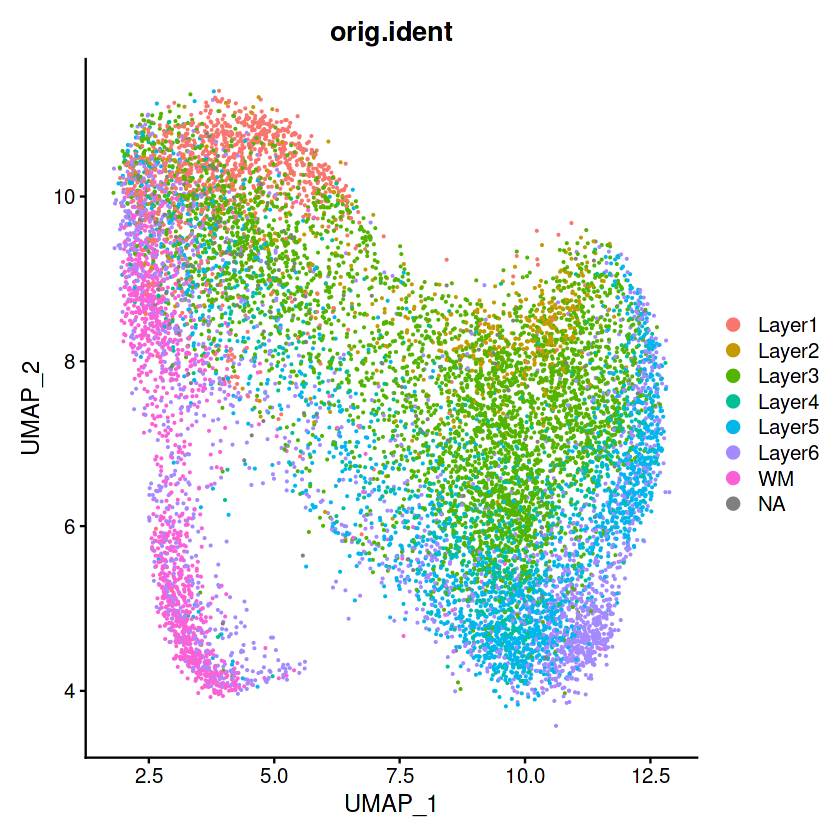


Layer1 Layer2 Layer3 Layer4 Layer5 Layer6     WM 
  1090    558   3779    891   2076   2060   1266 


   0    1    2    3    4    5    6    7    8    9   10 
2198 1847 1642 1441 1066  826  774  743  636  500  207 

[1] 11880

[1] 11720

[1] 11880

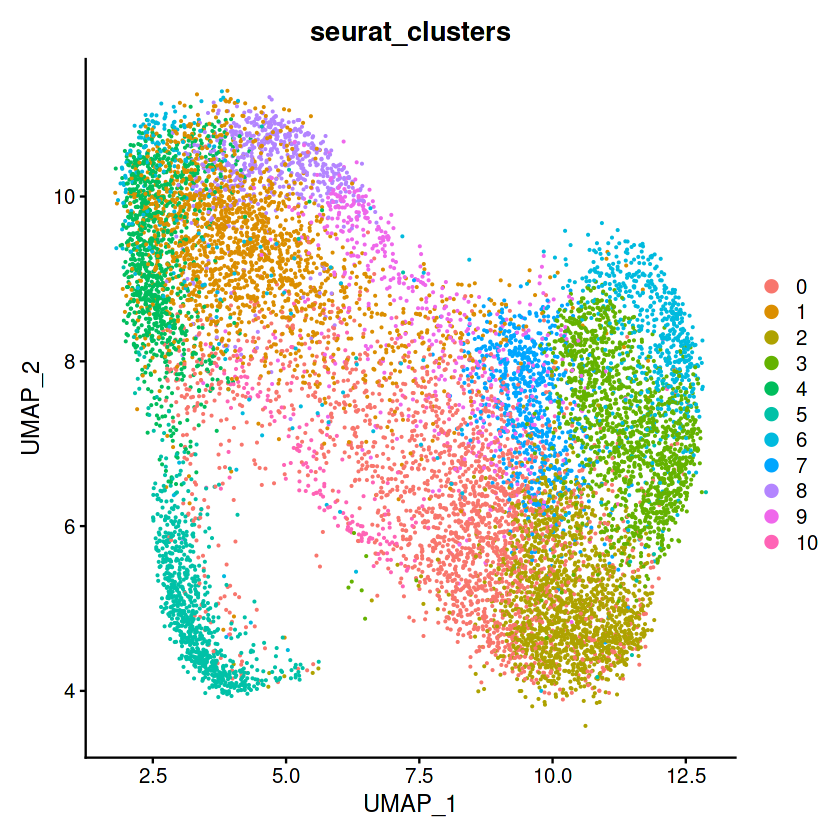

In [64]:
DimPlot(pbmc_batch, reduction='umap',group.by='orig.ident', pt.size=0.1) 
DimPlot(pbmc_batch, reduction='umap',group.by='seurat_clusters', pt.size=0.1) 
table(pbmc_batch$orig.ident)
table(pbmc_batch$seurat_clusters)
sum(table(pbmc_batch$batch))
sum(table(pbmc_batch$orig.ident))
sum(table(pbmc_batch$seurat_clusters))

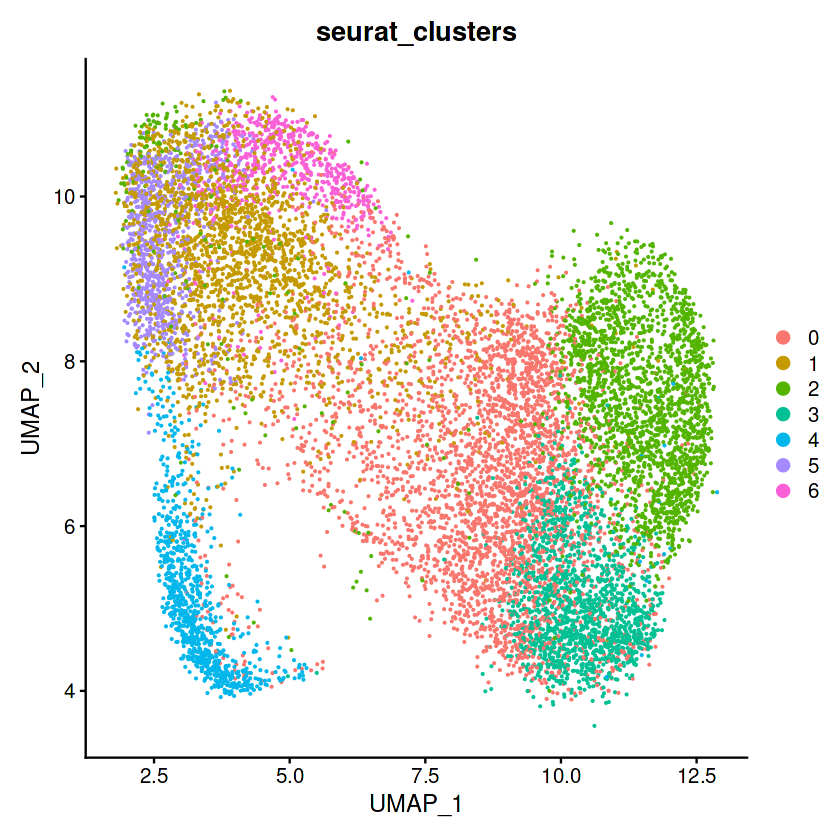

In [73]:
DimPlot(pbmc_batch, reduction='umap',group.by='seurat_clusters', pt.size=0.1) 

In [74]:
nona_batch <- pbmc_batch[,!is.na(pbmc_batch$orig.ident)]
nona_batch

An object of class Seurat 
67076 features across 11720 samples within 1 assay 
Active assay: RNA (67076 features, 2000 variable features)
 2 dimensional reductions calculated: pca, umap

In [76]:
ARI(nona_batch$seurat_clusters, nona_batch$orig.ident)

[1] 0.1267811

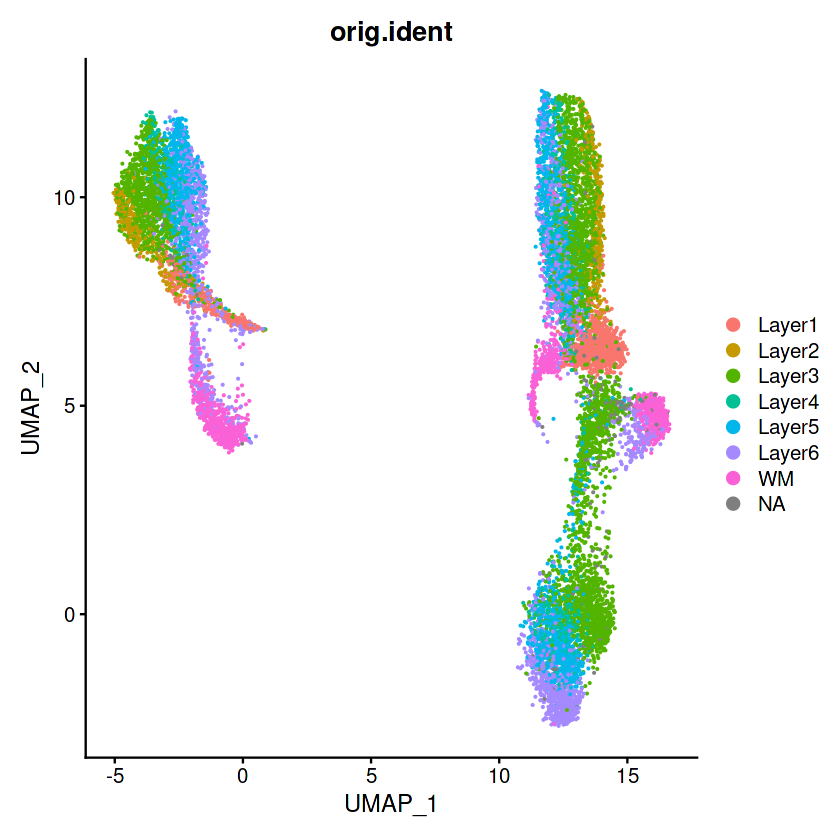

In [37]:
DimPlot(pbmc_batch, reduction='umap', group.by='orig.ident', pt.size=0.1) 

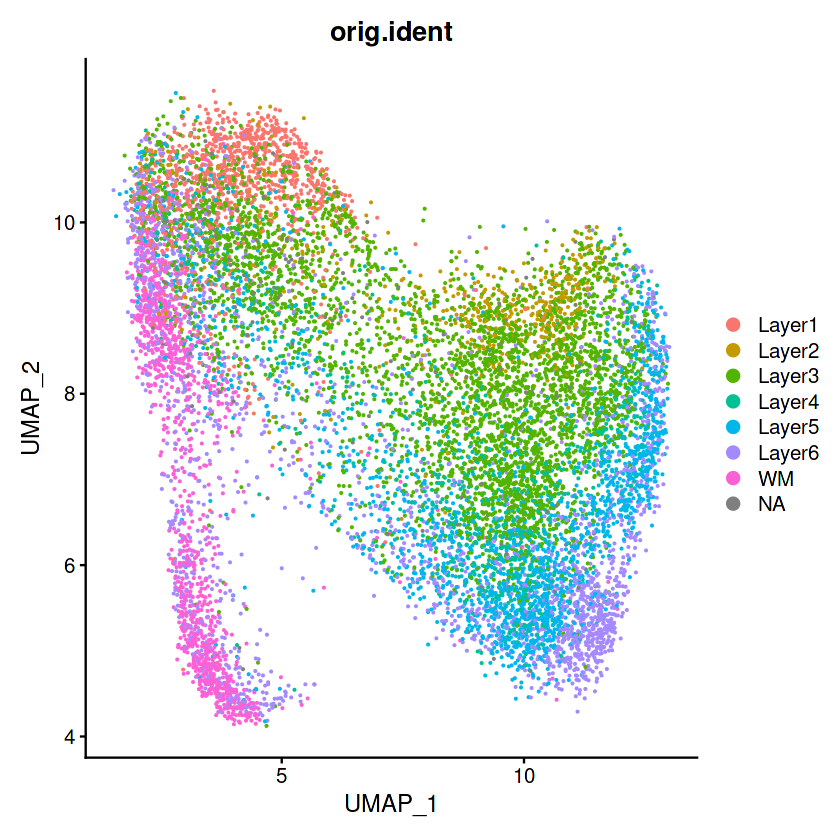

In [32]:
DimPlot(pbmc_batch, reduction='umap', group.by='orig.ident', pt.size=0.1) 

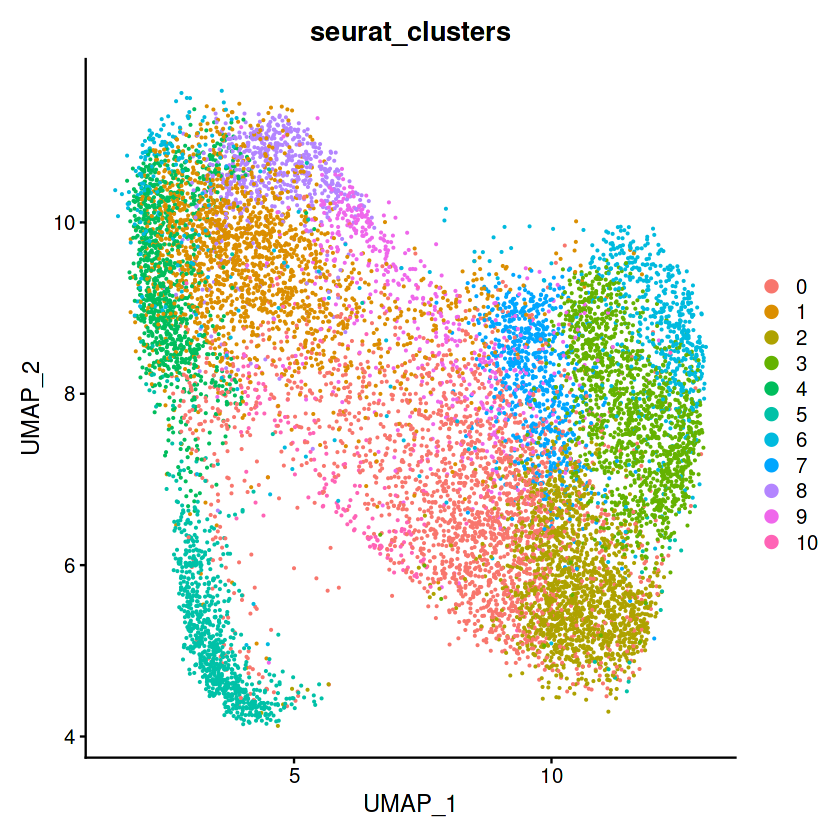

In [85]:
DimPlot(pbmc_batch, reduction='umap', group.by='seurat_clusters', pt.size=0.1) 

Centering and scaling data matrix

PC_ 1 
Positive:  3457 
Negative:  ENSG00000142192 



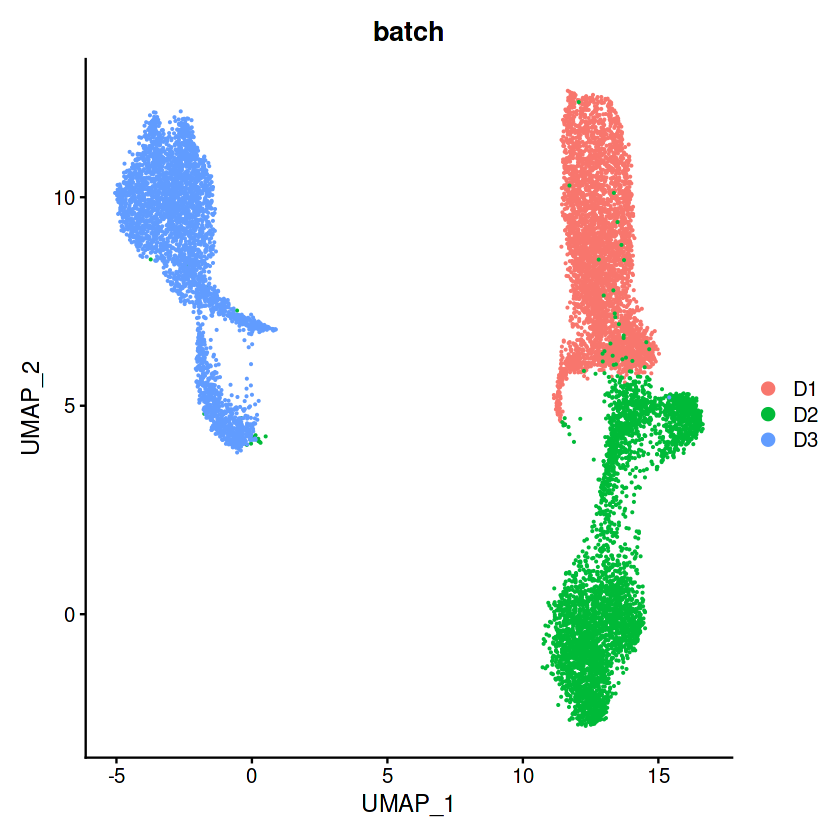

In [21]:
pbmc_batch=CreateSeuratObject(counts = DATA, min.cells = 0, min.features = 0, project = "ALL") 
pbmc_batch@meta.data$batch=BATCH
pbmc_batch=FindVariableFeatures(object = pbmc_batch, selection.method = "vst", nfeatures = 2000)   
# VariableFeatures(object = pbmc_batch)
pbmc_batch <- NormalizeData(object = pbmc_batch, normalization.method = "LogNormalize", scale.factor = 10000)
pbmc_batch <- ScaleData(object = pbmc_batch, features = VariableFeatures(object = pbmc_batch))
pbmc_batch <- RunPCA(object = pbmc_batch, seed.use=123, npcs=50, features = VariableFeatures(object = pbmc_batch), ndims.print=1,nfeatures.print=1)
pbmc_batch <- RunUMAP(pbmc_batch, dims = 1:50, seed.use = 123,n.components=2, umap.method = "umap-learn",  metric="correlation")
DimPlot(pbmc_batch, reduction='umap', group.by='batch', pt.size=0.1) 

In [33]:
plot_save <- DimPlot(pbmc_batch, reduction='umap', group.by='batch', pt.size=0.1)
ggsave('com3_unfil_umap_plot_baserow_0809_gnum50_pc30_GN1000_R2.png',plot_save)

Saving 6.67 x 6.67 in image


In [34]:
plot_save <- DimPlot(pbmc_batch, reduction='umap', group.by='orig.ident', pt.size=0.1)
ggsave('layer_com3_unfil_umap_plot_baserow_0809_gnum50_pc30_GN1000_R2.png',plot_save)

Saving 6.67 x 6.67 in image


In [31]:
pbmc@meta.data

,orig.ident,nCount_RNA,nFeature_RNA,batch,group,map
,<chr>,<dbl>,<int>,<chr>,<chr>,<chr>
AAACAACGAATAGTTC.1,Layer1,4761.129,6828,D1,D1_26,NA
AAACAAGTATCTCCCA.1,Layer3,5525.503,8271,D1,D1_10,V1
AAACAATCTACTAGCA.1,Layer1,5072.243,7194,D1,D1_16,NA
AAACACCAATAACTGC.1,WM,5609.661,7997,D1,D1_4,NA
AAACAGCTTTCAGAAG.1,Layer6,5389.841,7721,D1,D1_37,NA
AAACAGGGTCTATATT.1,Layer6,5417.953,8236,D1,D1_6,NA
AAACAGTGTTCCTGGG.1,WM,5242.483,7451,D1,D1_28,NA
AAACATTTCCCGGATT.1,Layer5,5592.206,8448,D1,D1_49,NA
AAACCACTACACAGAT.1,Layer3,5629.805,9012,D1,D1_19,V1


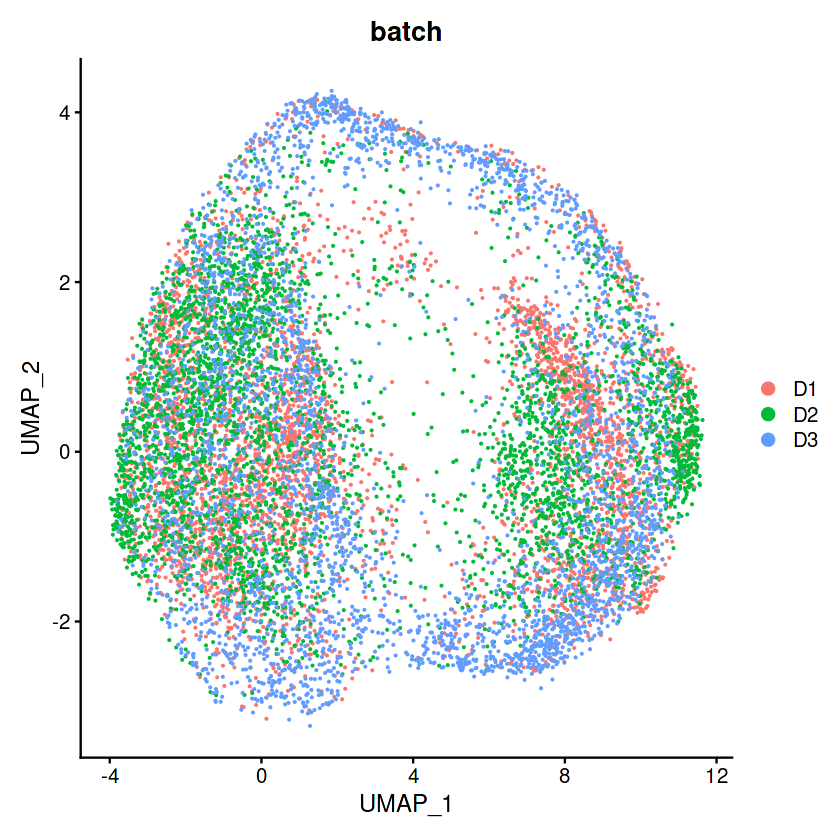

In [23]:
pbmc <- mybeer$seurat
PCUSE <- mybeer$select
pbmc <- RunUMAP(object = pbmc, reduction='pca',dims = PCUSE, umap.method='umap-learn', metric='correlation')

DimPlot(pbmc, reduction='umap', group.by='batch', pt.size=0.1)  

In [24]:
# library(ggplot2)
umap_plot <- DimPlot(pbmc, reduction='umap', group.by='batch', pt.size=0.1)  
ggsave('umap_plot_gg.png',umap_plot)

ERROR: Error in ggsave("umap_plot_gg.png", umap_plot): could not find function "ggsave"


In [2]:
D1=readRDS('demo_BEER/MGH36.RDS')
D2=readRDS('demo_BEER/MGH53.RDS')
D3=readRDS('demo_BEER/MGH54.RDS')
D4=readRDS('demo_BEER/MGH60.RDS')
D5=readRDS('demo_BEER/MGH93.RDS')
D6=readRDS('demo_BEER/MGH97.RDS')

BATCH=c(rep('D1',ncol(D1)),
        rep('D2',ncol(D2)),
        rep('D3',ncol(D3)),
        rep('D4',ncol(D4)),
        rep('D5',ncol(D5)),
        rep('D6',ncol(D6)) )
        
D12=.simple_combine(D1,D2)$combine
D34=.simple_combine(D3,D4)$combine
D56=.simple_combine(D5,D6)$combine
D1234=.simple_combine(D12,D34)$combine
D123456=.simple_combine(D1234,D56)$combine

DATA=D123456   

# rm(D1);rm(D2);rm(D3);rm(D4);rm(D5);rm(D6)
# rm(D12);rm(D34);rm(D56);rm(D1234);rm(D123456)

[1] "BEER start!"
[1] "2023-03-09 15:55:44 KST"


Loading required package: stringi



[1] "Group number (GNUM) is:"
[1] 30
[1] "Varible gene number (GN) of each batch is:"
[1] 2000
[1] "ROUND is:"
[1] 1
[1] 1
[1] "D1"


Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”


[1] 2
[1] "D2"


Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”


[1] 3
[1] "D3"


Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”


[1] 4
[1] "D4"


Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”


[1] 5
[1] "D5"


Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”


[1] 6
[1] "D6"


Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”


[1] "Total varible gene number (GN) is:"
[1] 4554


Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”


Found 991 genes with uniform expression within a single batch (all zeros); these will not be adjusted for batch.


Found6batches

Adjusting for0covariate(s) or covariate level(s)

Standardizing Data across genes

Fitting L/S model and finding priors

Finding parametric adjustments

Adjusting the Data


Centering and scaling data matrix



[1] "Calculating PCs ..."


PC_ 1 
Positive:  BCAN 
Negative:  C1QC 



[1] "Get group for:"
[1] "D1"
[1] "Group Number:"
[1] 30
[1] "Get group for:"
[1] "D2"
[1] "Group Number:"
[1] 30
[1] "Get group for:"
[1] "D3"
[1] "Group Number:"
[1] 30
[1] "Get group for:"
[1] "D4"
[1] "Group Number:"
[1] 30
[1] "Get group for:"
[1] "D5"
[1] "Group Number:"
[1] 30
[1] "Get group for:"
[1] "D6"
[1] "Group Number:"
[1] 30
[1] "Finding MN pairs..."
[1] "1 / 180"
[1] "101 / 180"
[1] "ROUND:"
[1] 1
[1] "Number of MN pairs:"
[1] 34
[1] "Evaluating PCs ..."
[1] "Start"
[1] 1
[1] 2
[1] 3
[1] 4
[1] 5
[1] 6
[1] 7
[1] 8
[1] 9
[1] 10
[1] 11
[1] 12
[1] 13
[1] 14
[1] 15
[1] 16
[1] 17
[1] 18
[1] 19
[1] 20
[1] 21
[1] 22
[1] 23
[1] 24
[1] 25
[1] 26
[1] 27
[1] 28
[1] 29
[1] 30
[1] 31
[1] 32
[1] 33
[1] 34
[1] 35
[1] 36
[1] 37
[1] 38
[1] 39
[1] 40
[1] 41
[1] 42
[1] 43
[1] 44
[1] 45
[1] 46
[1] 47
[1] 48
[1] 49
[1] 50
[1] "Finished!!!"
[1] "############################################################################"
[1] "BEER cheers !!! All main steps finished."
[1] "###################

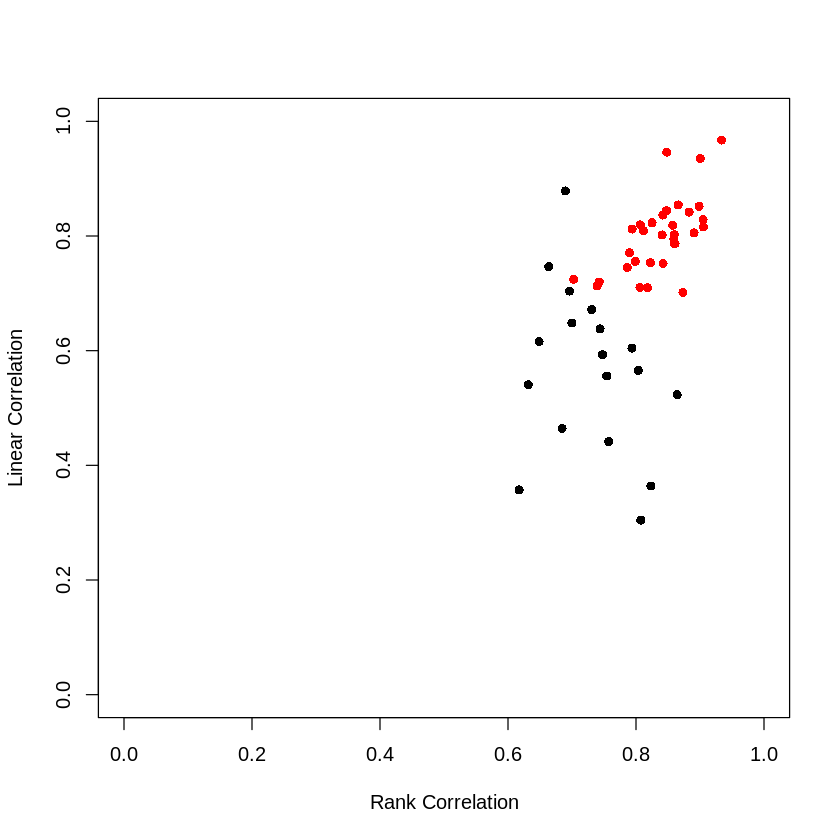

In [3]:
mybeer=BEER(DATA, BATCH, GNUM=30, PCNUM=50, ROUND=1, GN=2000, SEED=1, COMBAT=TRUE )

# Check selected PCs
PCUSE=mybeer$select
COL=rep('black',length(mybeer$cor))
COL[PCUSE]='red'
plot(mybeer$cor,mybeer$lcor,pch=16,col=COL,
    xlab='Rank Correlation',ylab='Linear Correlation',xlim=c(0,1),ylim=c(0,1))

Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Centering and scaling data matrix

PC_ 1 
Positive:  LAPTM5 
Negative:  BCAN 



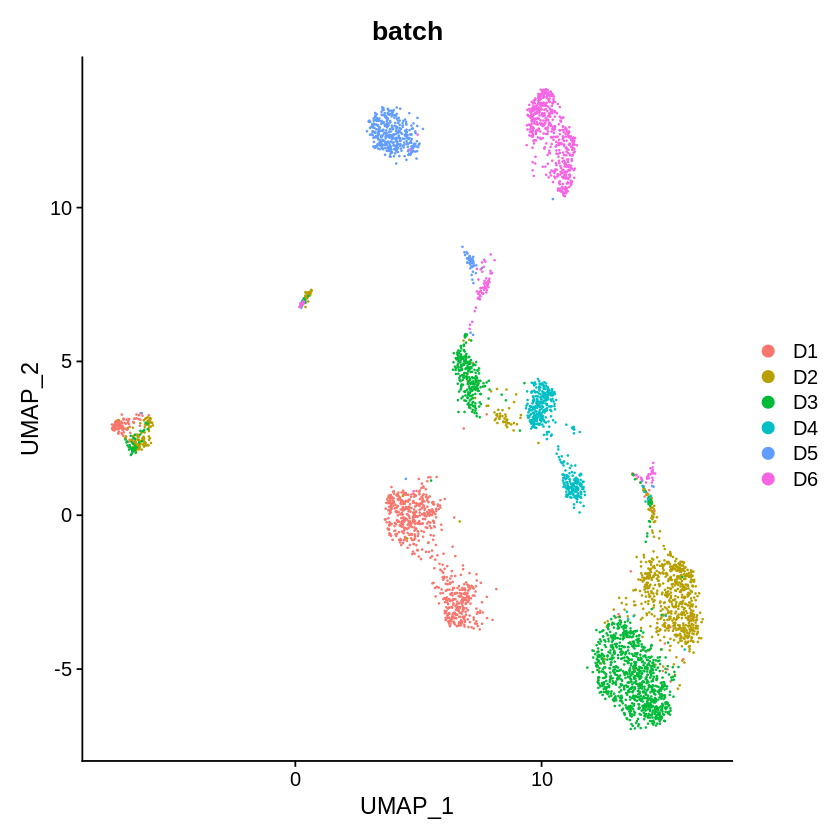

In [4]:
pbmc_batch=CreateSeuratObject(counts = DATA, min.cells = 0, min.features = 0, project = "ALL") 
pbmc_batch@meta.data$batch=BATCH
pbmc_batch=FindVariableFeatures(object = pbmc_batch, selection.method = "vst", nfeatures = 2000)   
# VariableFeatures(object = pbmc_batch)
pbmc_batch <- NormalizeData(object = pbmc_batch, normalization.method = "LogNormalize", scale.factor = 10000)
pbmc_batch <- ScaleData(object = pbmc_batch, features = VariableFeatures(object = pbmc_batch))
pbmc_batch <- RunPCA(object = pbmc_batch, seed.use=123, npcs=50, features = VariableFeatures(object = pbmc_batch), ndims.print=1,nfeatures.print=1)
pbmc_batch <- RunUMAP(pbmc_batch, dims = 1:50, seed.use = 123,n.components=2, umap.method = "umap-learn",  metric="correlation")
DimPlot(pbmc_batch, reduction='umap', group.by='batch', pt.size=0.1) 

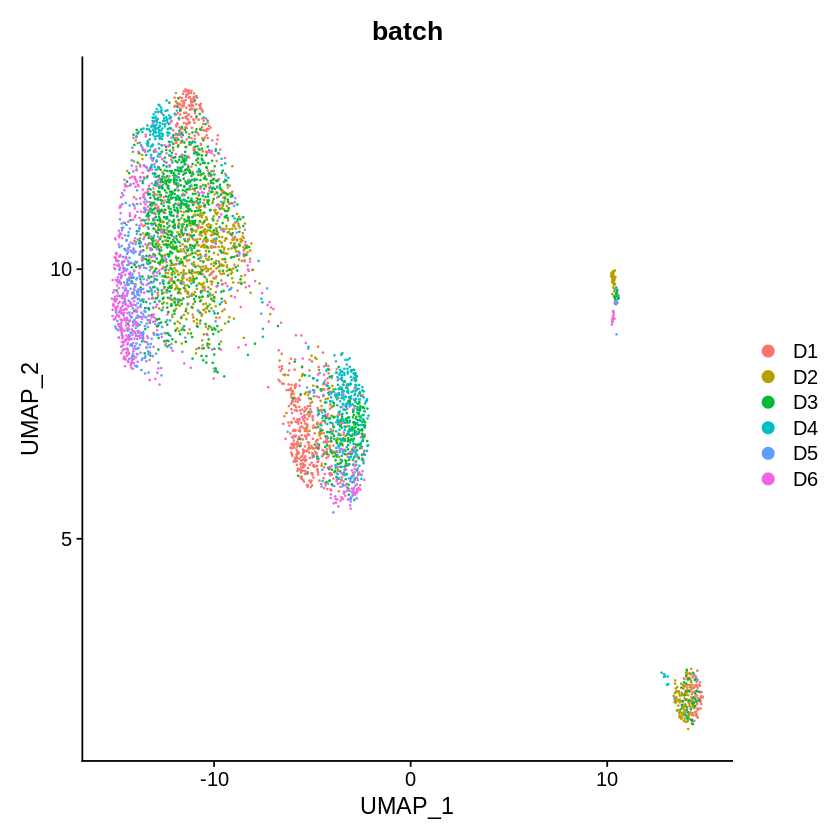

In [5]:
pbmc <- mybeer$seurat
PCUSE <- mybeer$select
pbmc <- RunUMAP(object = pbmc, reduction='pca',dims = PCUSE, umap.method='umap-learn', metric='correlation')

DimPlot(pbmc, reduction='umap', group.by='batch', pt.size=0.1)  

Warning message:
“The following arguments are not used: check_duplicates”


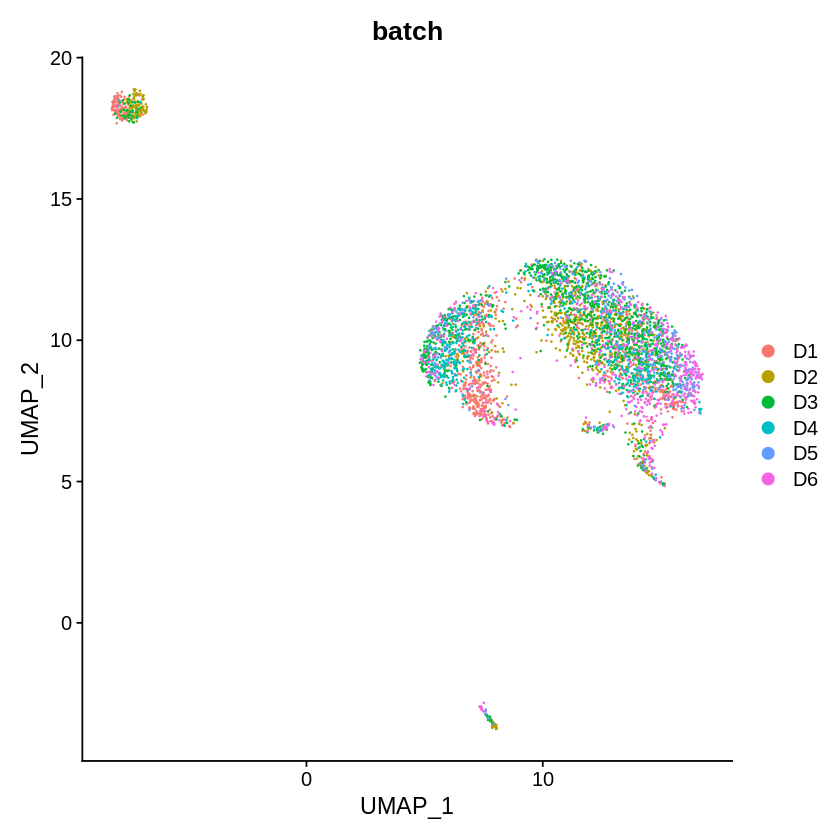

In [6]:
pbmc <- mybeer$seurat
PCUSE <- mybeer$select
pbmc <- RunUMAP(object = pbmc, reduction='pca',dims = PCUSE, check_duplicates=FALSE, umap.method='umap-learn', metric='correlation')

DimPlot(pbmc, reduction='umap', group.by='batch', pt.size=0.1)  

In [ ]:
D1 <- read.table("demo_BEER/DATA1_MAT.txt", sep='\t', row.names=1, header=T)
D2 <- read.table("demo_BEER/DATA2_MAT.txt", sep='\t', row.names=1, header=T)

In [ ]:
colnames(D1)=paste0('D1_', colnames(D1))
colnames(D2)=paste0('D2_', colnames(D2))

DATA=.simple_combine(D1,D2)$combine

BATCH=rep('D2',ncol(DATA))
BATCH[c(1:ncol(D1))]='D1'

In [ ]:
mybeer=BEER(DATA, BATCH, GNUM=30, PCNUM=50, ROUND=1, GN=2000, SEED=1, COMBAT=TRUE, RMG=NULL) 

In [ ]:
PCUSE=mybeer$select
COL=rep('black',length(mybeer$cor))
COL[PCUSE]='red'
plot(mybeer$cor,mybeer$lcor,pch=16,col=COL,
    xlab='Rank Correlation',ylab='Linear Correlation',xlim=c(0,1),ylim=c(0,1))

In [ ]:
pbmc_batch=CreateSeuratObject(counts = DATA, min.cells = 0, min.features = 0, project = "ALL") 
pbmc_batch@meta.data$batch=BATCH
pbmc_batch=FindVariableFeatures(object = pbmc_batch, selection.method = "vst", nfeatures = 2000)   
VariableFeatures(object = pbmc_batch)
pbmc_batch <- NormalizeData(object = pbmc_batch, normalization.method = "LogNormalize", scale.factor = 10000)
pbmc_batch <- ScaleData(object = pbmc_batch, features = VariableFeatures(object = pbmc_batch))
pbmc_batch <- RunPCA(object = pbmc_batch, seed.use=123, npcs=50, features = VariableFeatures(object = pbmc_batch), ndims.print=1,nfeatures.print=1)
pbmc_batch <- RunUMAP(pbmc_batch, dims = 1:50, seed.use = 123,n.components=2)
DimPlot(pbmc_batch, reduction='umap', group.by='batch', pt.size=0.1) 

In [ ]:
pbmc <- mybeer$seurat
PCUSE <- mybeer$select
pbmc <- RunUMAP(object = pbmc, reduction='pca',dims = PCUSE, check_duplicates=FALSE)

DimPlot(pbmc, reduction='umap', group.by='batch', pt.size=0.1) 